This notebook simulates scopes and analyzed them for the XEC acid dataset using features of the substrates combinations.

In [1]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join('..','..','..')))
from Code.utils import calculate_vendi_score, obtain_full_covar_matrix
from Code.predictor import ScopeBO
from pathlib import Path
import pandas as pd
import numpy as np
import itertools
import seaborn as sns
import matplotlib.pyplot as plt
from Code.benchmark import Benchmark
from Code.predictor import ScopeBO
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import scale
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import cdist
from umap import UMAP
import shutil
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem import AllChem
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.interpolate import PchipInterpolator
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import colorsys

# Doyle colors
doyle_colors = ["#CE4C6F", "#1561C2", "#188F9D","#C4ADA2","#515798", "#CB7D85", "#A9A9A9"]
# extension of palette with lighter and darker versions
def adjust_lightness(color, factor=1.2):
    """
    Function to make colors lighter (factor > 1) or darker (factor < 1).
    """
    r, g, b = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    l = max(0, min(1, l * factor))
    r, g, b = colorsys.hls_to_rgb(h, l, s)
    return mcolors.to_hex((r, g, b))

lighter = [adjust_lightness(c, 1.2) for c in doyle_colors]
darker  = [adjust_lightness(c, 0.7) for c in doyle_colors]
all_colors = doyle_colors + darker[::-1] + lighter[::-1] 

# Save the categorical colormap
cat_cmap = ListedColormap(all_colors, name="Doyle_cat")
plt.colormaps.register(cat_cmap)

# Define and save a continuous colormap
colors = [doyle_colors[1],"#FFFFFFD1",doyle_colors[0]]
cont_cmap = LinearSegmentedColormap.from_list("Doyle_cont", colors)
plt.colormaps.register(cont_cmap)

wdir = Path(".")

# General plt parameters
plt.rcParams.update({
    "axes.titlesize": 20,        # Subplot title
    "axes.labelsize": 16,        # X and Y labels
    "figure.titlesize": 24,      # Suptitle
    "xtick.labelsize": 14,       # X tick labels
    "ytick.labelsize": 14,       # Y tick labels
    "legend.fontsize": 14,       # Legend text
    "legend.title_fontsize": 14, # Legend titles
    "font.family": "Helvetica"   # Font
})

### Determination of the bounds

In order to calculate scope scores for this dataset, we first established objective bounds for the normalization of them using the workflow established in the hyperparameter optimization for the ArI oxidative addtion dataset.

In [2]:
# # Low vendi and high objective bounds with the greedy acquisition function without pruning
# Benchmark().collect_data(
#     filename_labelled = "./../XEC_data/Datasets/xec_dft_data_acid_scope.csv",
#     name_results = "./Results_Data/bounds/greedy40",
#     objectives=['yield'],
#     budget = 40,
#     batches= [1,2,3,4],
#     Vendi_pruning_fractions = [0],
#     seeds = 40,
#     acquisition_function_mode= "greedy",
#     init_sampling_method="random")

In [3]:
# # High vendi and low objective bounds with the explorative acquisition function with max pruning for the respective batch size
# run_settings = {1: 10, 2: 20, 3: 29, 4: 38}
# for batch_size in run_settings.keys():
#     Benchmark().collect_data(
#         filename_labelled = "./../XEC_data/Datasets/xec_dft_data_acid_scope.csv",
#         name_results = f"./Results_Data/bounds/explorative40_b{batch_size}",
#         objectives=['yield'],
#         budget = 40,
#         batches= [batch_size],
#         Vendi_pruning_fractions = [run_settings[batch_size]],
#         seeds = 40,
#         acquisition_function_mode= "explorative",
#         pruning_metric= "vendi_batch",
#         init_sampling_method="random")

In [4]:
# Use the results of the greedy acqusition function (no pruning) with scope size 40, to get the upper bounds for the yield and the lower bounds for 
# the vendi score.
dfs_bounds_greedy = {}
for metric in ["yield","vendi"]:
    dfs_bounds_greedy[metric] = Benchmark().heatmap_plot(type_results=metric,
                                                         name_results="./Results_Data/bounds/greedy40",
                                                         budget=40,show_plot=False)
bounds_greedy = pd.concat(dfs_bounds_greedy,axis=1)
bounds_greedy.columns = ["yield","vendi"]
yield_max = bounds_greedy["yield"].max()
vendi_min = bounds_greedy["vendi"].min()
print(f"upper bounds yield: {yield_max}")
print(f"lower bounds vendi score: {vendi_min}")

upper bounds yield: 49.996187500000005
lower bounds vendi score: 2.6221917983934344


In [5]:
# Use the results of the explorative acqusition function (max pruning) with scope size 40, to get the lower bounds for the yield and the upper bounds for 
# the vendi score.
dfs_bounds_explorative = {}
for metric in ["yield","vendi"]:
    dfs_metric = {}
    for batch_size in [1,2,3,4]:
        dfs_metric[batch_size] = Benchmark().heatmap_plot(type_results=metric,budget=40,show_plot=False,
                                                          name_results=f"./Results_Data/bounds/explorative40_b{batch_size}")
    explorative_values = pd.concat(dfs_metric,axis=1)
    explorative_values.columns = [1,2,3,4]
    explorative_values = explorative_values.stack().reset_index(drop=True)
    dfs_bounds_explorative[metric] = pd.DataFrame({metric: explorative_values})
bounds_explorative = pd.concat(dfs_bounds_explorative,axis=1)
bounds_explorative.columns = ["yield","vendi"]
yield_min = bounds_explorative["yield"].min()
vendi_max = bounds_explorative["vendi"].max()
print(f"lower bounds yield: {yield_min}")
print(f"upper bounds vendi score: {vendi_max}")

lower bounds yield: 20.799500000000002
upper bounds vendi score: 8.327147197351627


In [6]:
# Record the bounds
yield_bounds = (yield_max,yield_min)
vendi_bounds = (vendi_max,vendi_min)
bounds = {"yield": yield_bounds, "vendi": vendi_bounds}

### Scope runs with different BO-based methods

After having established the bounds for the objectives, we can run the scopes with different acquisition functions using the optimized conditions and also without Vendi pruning.

In [7]:
# for acq in ["ei","random-selection","greedy","explorative"]:
#     if acq == "ei":
#         acq_label = "balanced"
#     elif acq == "random-selection":
#         acq_label = "random"
#     else:
#         acq_label = acq
#     for pruning in [False,True]:
#         if pruning:
#             pruning_label = "with-pruning"
#             pruning_fraction = 13
#         else:
#             pruning_label = "no-pruning"
#             pruning_fraction = 0
#         Benchmark().collect_data(
#             filename_labelled = f"./../XEC_data/Datasets/xec_dft_data_acid_scope.csv",
#             name_results = f"./Results_Data/comb_scope/scope_{acq}_{pruning_label}",
#             objectives=['yield'],
#             budget = 27,
#             batches= [3],
#             Vendi_pruning_fractions = [pruning_fraction],
#             seeds = 40,
#             acquisition_function_mode= acq_label,
#             pruning_metric= "vendi_batch",
#             init_sampling_method="random")

In [8]:
# # simulate scopes similar to how humans conventionally select scopes
# Benchmark().collect_data(
#     filename_labelled = f"./../XEC_data/Datasets/xec_dft_data_acid_scope.csv",
#     name_results = f"./Results_Data/comb_scope/scope_human-like-acq",
#     objectives=['yield'],
#     budget = 27,
#     batches= [3],
#     Vendi_pruning_fractions = [5],
#     seeds = 40,
#     acquisition_function_mode= "greedy",
#     pruning_metric= "vendi_batch",
#     init_sampling_method="random")

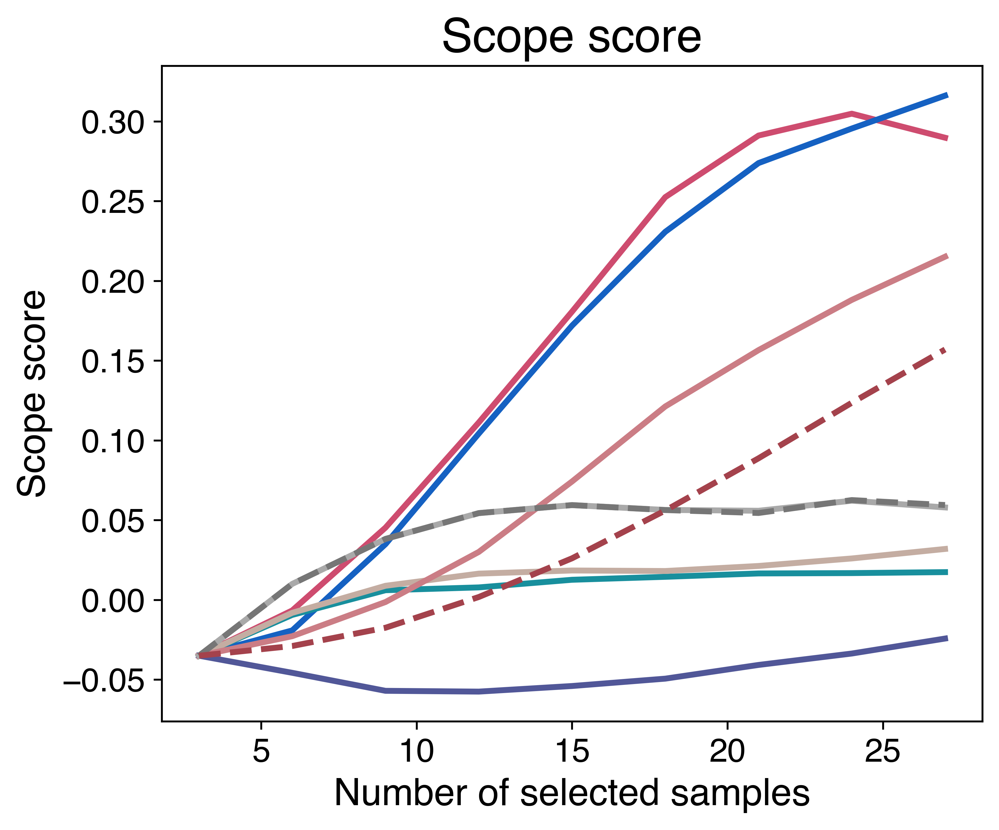

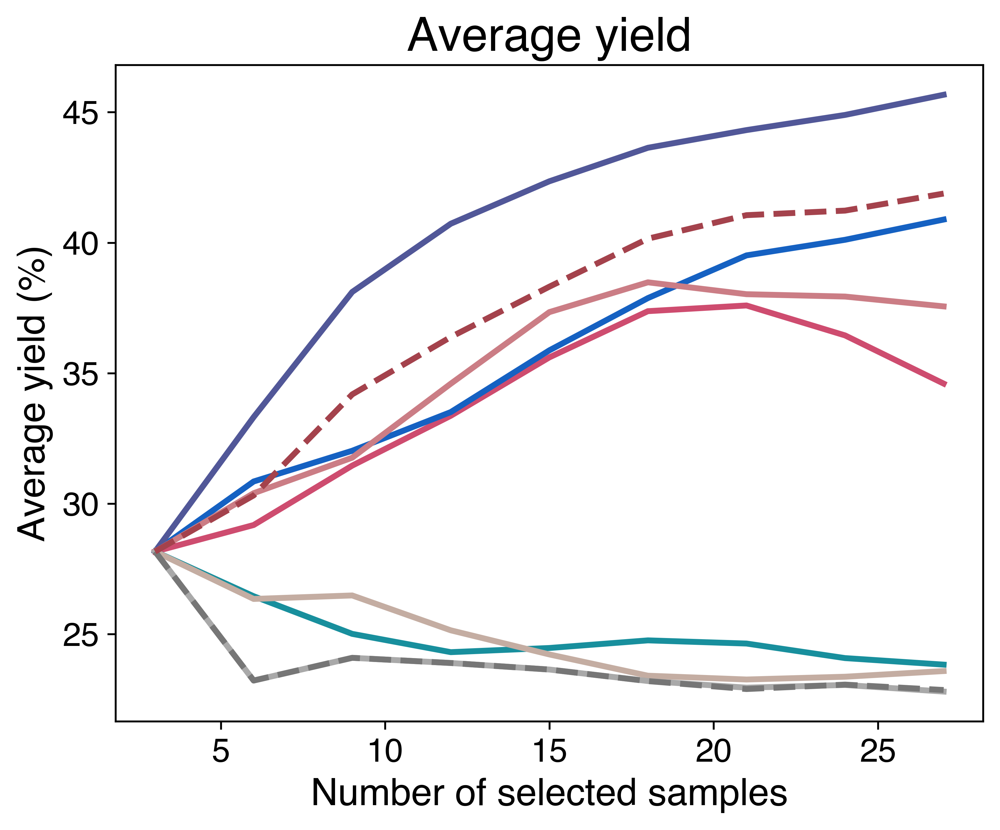

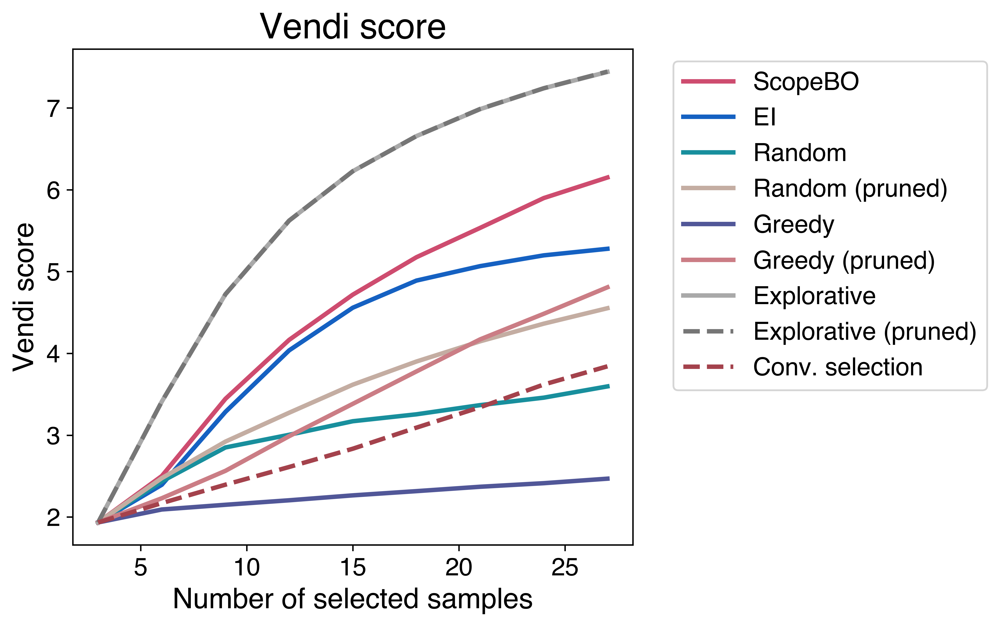

In [9]:
def score_overview(metrics, show_legend=True):
    for type_results in metrics:
        # Initialize the figure
        width = 8
        if not show_legend:
            width = 6
        plt.figure(figsize=(width,5),dpi=600)
        dfs = {}
        for acq in ["EI","Random","Greedy","Explorative","Conv. selection"]:
            if acq.lower() == "random":
                acq_label = "random-selection"
            elif acq == "Conv. selection":
                acq_label = "human-like-acq"
            else:
                acq_label = acq.lower()
            for pruning in [False,True]:
                if pruning:
                    pruning_label = "_with-pruning"
                else:
                    pruning_label = "_no-pruning"
                if acq == "Conv. selection":
                    pruning_label = ""
                dfs_progress = Benchmark().progress_plot(budget=27, type_results= type_results,
                                        name_results=f"./Results_Data/comb_scope"\
                                            f"/scope_{acq_label}{pruning_label}",
                                        bounds={"yield":yield_bounds,"vendi":vendi_bounds},show_plot=False)
                dfs[acq+pruning_label] = dfs_progress["means"]
        df_combined = pd.concat(dfs,axis=1)
        df_combined.columns = [multiindex[0] for multiindex in df_combined.columns]
        df_combined.rename(columns={"EI_with-pruning":"ScopeBO"},inplace=True)
        df_combined = df_combined[["ScopeBO"] + [col for col in df_combined.columns if col != "ScopeBO"]]
        label_dict = {col: col for col in df_combined.columns}
        for key,val in label_dict.items():
            if "_no-pruning" in val:
                label_dict[key] = val.split("_")[0]
            elif "with-pruning" in val:
                label_dict[key] = val.split("_")[0] + " (pruned)"
        df_combined.rename(columns=label_dict,inplace=True)
        # if type_results != "Scope":
        #     df_combined = df_combined[["ScopeBO","EI"]]
        for j,col in enumerate(df_combined.columns):
            style = '-' if j <= 6 else '--' if j <= 13 else ':'
            plotting = df_combined[col][df_combined[col].notna()]
            plt.plot(plotting.index, plotting.values, label = col, color=all_colors[j], linestyle=style, linewidth=2.5)
        plt.xlabel('Number of selected samples')
        plt.ylabel(f"{type_results} score")
        if type_results == "Objective":
            plt.title("Average yield")
            plt.ylabel("Average yield (%)")
        else:
            plt.title(f"{type_results} score")
        if show_legend:
            plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
        plt.tight_layout()
        plt.show()

score_overview(["Scope","Objective"],show_legend=False)
score_overview(["Vendi"],show_legend=True)

Summarize the data

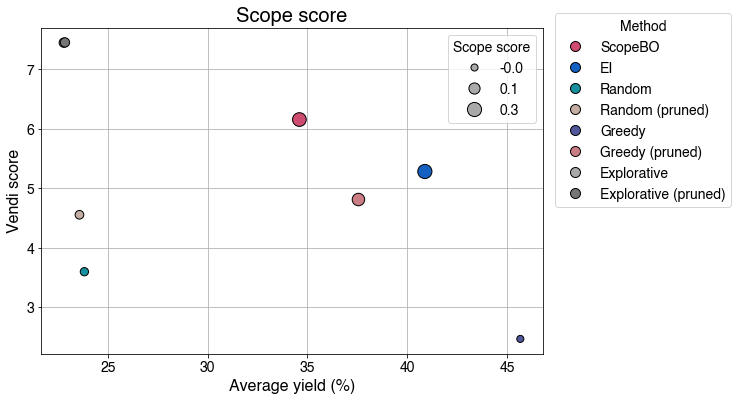

,ScopeBO,EI,Random,Random (pruned),Greedy,Greedy (pruned),Explorative,Explorative (pruned)
Average yield (%),34.598056,40.885000,23.825648,23.578519,45.668148,37.557222,22.793056,22.852778
Vendi score,6.150237,5.278647,3.596788,4.552337,2.469013,4.808141,7.440240,7.444452
Scope score,0.289722,0.316091,0.017398,0.031920,-0.024242,0.215130,0.057945,0.059463


In [10]:
acq_fct = ["EI","Random","Greedy","Explorative"]
pruning_opt = [False,True]

map_data = {}
for acq in acq_fct:
    acq_label = acq.lower()
    if acq == "Random":
        acq_label = "random-selection"
    for pruning in [False,True]:
        if pruning:
            pruning_label = "with-pruning"
        else:
            pruning_label = "no-pruning"
        run_results = []
        for type_results in ["Objective","Vendi","Scope"]:
            dfs_scaled, _ = Benchmark.get_metric_overview(budget=27,type_results=type_results,
                                            name_results=f"Results_Data/comb_scope"\
                                                f"/scope_{acq_label}_{pruning_label}",
                                             bounds = bounds)
            run_results.append(dfs_scaled["means"].iloc[-1,0])  # save the last mean which is the result at the end of the scope
        map_data[f"{acq}_{pruning_label}"] = run_results
map_df = pd.DataFrame.from_dict(map_data)
map_df.rename(columns={"EI_with-pruning":"ScopeBO"},inplace=True)
map_df = map_df[["ScopeBO"] + [col for col in map_df.columns if col != "ScopeBO"]]
label_dict = {col: col for col in map_df.columns}
for key,val in label_dict.items():
    if "_no-pruning" in val:
        label_dict[key] = val.split("_")[0]
    elif "with-pruning" in val:
        label_dict[key] = val.split("_")[0] + " (pruned)"
map_df.rename(columns=label_dict,inplace=True)

# Plot the results
x = map_df.iloc[0]
y = map_df.iloc[1]
raw_size_data = map_df.iloc[2]
labels = map_df.columns

size_min, size_max = 50, 200
data_min, data_max= raw_size_data.min(), raw_size_data.max()
sizes = size_min + (raw_size_data - data_min) * (size_max - size_min) / (data_max - data_min)

# simplify the labels for the legend
labels = list(labels)
for i,val in enumerate(labels):
    if val == "EI_pruning":
        labels[i] = "ScopeBO"
    elif "no-pruning" in val:
        labels[i] = val.split("_")[0]
    elif "_pruning" in val:
        labels[i] = val.split("_")[0] + " (pruned)"

color_map = {label: all_colors[i] for i, label in enumerate(labels)}
colors = [color_map[label] for label in labels]

plt.figure(figsize=(9,6),
        #    dpi=600
           )
plt.title(f"Performance map")
plt.scatter(x, y, s=sizes, alpha=1, c = colors, edgecolors="k",zorder=2)

plt.xlabel('Average yield (%)')
plt.ylabel('Vendi score')
plt.title('Scope score')
plt.grid(True,zorder=1)

# legend for different methods (color)
color_legend = [
    Line2D(
        [0], [0],
        marker='o',
        color='w',
        label=label,
        markerfacecolor=color_map[label],
        alpha=1,
        markeredgecolor='k',
        markersize=10
    )
    for label in labels
]

# scope score legend (data point size)
# Choose representative raw size values
size_legend_values = np.linspace(raw_size_data.min(), raw_size_data.max(), 3)
size_legend_sizes = size_min + (size_legend_values - data_min) * (size_max - size_min) / (data_max - data_min)
size_legend = [
    Line2D(
        [0], [0],
        marker='o',
        color='w',
        label=f'{val:.1f}',
        markerfacecolor=all_colors[6],
        alpha=1,
        markeredgecolor='k',
        markersize=np.sqrt(s)  # matplotlib sizes are in area, markersize is radius
    )
    for val, s in zip(size_legend_values, size_legend_sizes)
]

# Add legends
first_legend = plt.legend(handles=color_legend, loc = "lower left", title="Method", frameon=True,
                          bbox_to_anchor=(1.01, 0.43))
plt.gca().add_artist(first_legend)

second_legend = plt.legend(handles=size_legend, title="Scope score", frameon=True)

plt.show()

map_df.index = ["Average yield (%)","Vendi score", "Scope score"]
map_df

### Statistical tests

To test for statistically significant differences between the selection methods, we carried out a Friedman test for each dataset to test if the scope scores are similar between the methods.

Note that we can not carry out these tests for clustering-based methods as they are deterministic and do not provide a distribution of scope score results.

In [11]:
# read in the data
scope_scores = None
vendi_scores = None
av_yields = None
renaming = {"Greedy_no-pruning":"Greedy",
            "Greedy_with-pruning":"Greedy (pruned)",
            "EI_no-pruning":"EI",
            "EI_with-pruning":"ScopeBO",
            "Explorative_with-pruning":"Explorative (pruned)",
            "Explorative_no-pruning":"Explorative",
            "Random_no-pruning":"Random",
            "Random_with-pruning":"Random (pruned)",
            "Conv. selection":"Conv. selection"}

for score_type in ["scope","vendi","yield"]:
    scores = pd.DataFrame(np.nan, index=list(renaming.values()), columns=list(range(40)))
    for acq in ["EI","Random","Greedy","Explorative","Conv. selection"]:
        if acq.lower() == "random":
            acq_label = "random-selection"
        elif acq.lower() == "conv. selection":
            acq_label = "human-like-acq"
        else:
            acq_label = acq.lower()
        for pruning in [True,False]:
            if acq.lower() == "conv. selection" and pruning:
                continue  # only read the human-like acq once (no pruning distinction)
            if pruning:
                pruning_label = "_with-pruning"
            else:
                pruning_label = "_no-pruning"
            if acq.lower() == "conv. selection":
                pruning_label = ""
            _, dict_data = Benchmark().get_metric_overview(bounds = {"yield":yield_bounds,"vendi":vendi_bounds}, budget = 27,
                                                name_results=f"Results_Data/comb_scope"\
                                                    f"/scope_{acq_label}{pruning_label}", 
                                                type_results=score_type)
            for seed_dict in dict_data.values():
                for seed, df in seed_dict.items():
                    scores.loc[renaming[acq+pruning_label], seed] = df.loc[8,score_type]
    if score_type == "scope":
        scope_scores = scores.copy()
    elif score_type == "vendi":
        vendi_scores = scores.copy()
    elif score_type == "yield":
        av_yields = scores.copy()

In [12]:
from scipy.stats import friedmanchisquare
print("Friedman test results for Scope scores:\n")
res = friedmanchisquare(*scope_scores.values)
print("Friedman statistic:", res.statistic, "\np-value:", res.pvalue)

Friedman test results for Scope scores:

Friedman statistic: 245.38029350104836 
p-value: 1.641670358678456e-48


In [13]:
print("Friedman test results for Vendi scores:\n")
res = friedmanchisquare(*vendi_scores.values)
print("Friedman statistic:", res.statistic, "\np-value:", res.pvalue)

Friedman test results for Vendi scores:

Friedman statistic: 309.0780856423174 
p-value: 4.808034356671761e-62


In [14]:
print("Friedman test results for average yields:\n")
res = friedmanchisquare(*av_yields.values)
print("Friedman statistic:", res.statistic, "\np-value:", res.pvalue)

Friedman test results for average yields:

Friedman statistic: 248.16436058700222 
p-value: 4.220001299830298e-49


Differences between the selection methods were found (null hypothesis rejected as p < 5%) for all metrics. Thus, we continue with two-sided Wilcoxon tests between ScopeBO and the other methods, controlling for the initiation seed, while correcting for multiple comparisons with the Holm-Bonferroni method.

In [15]:
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests

def wilcoxon_tests(df):
    """
    Function for performing pairwise Wilcoxon signed-rank tests 
    comparing ScopeBO to each other method, with Holm-Bonferroni correction.
    """
    methods = df.index.tolist()
    reference = methods[3]  # ScopeBo is the 4th method in index of the df

    comparisons = []
    p_values = []

    for method in methods:
        if method == reference:
            continue
        
        # Two-sided Wilcoxon of ScopeBo versus the other method
        stat, p = wilcoxon(
            df.loc[reference],
            df.loc[method],
            alternative= "two-sided"
        )
        
        comparisons.append(method)
        p_values.append(p)

    # Holm-Bonferroni correction
    reject, pvals_corrected, _, _ = multipletests(
        p_values,
        alpha=0.05,
        method='holm'
    )
    print(comparisons)
    results = pd.DataFrame({
        "Comparison": comparisons,
        "Corrected p-value": pvals_corrected,
        "ScopeBO higher?": [np.mean(df.loc[reference].values) > np.mean(df.loc[comp].mean()) for comp in comparisons],
        "Different?": reject,
    })

    print(f"Reference method: {reference}")
    display(results)

In [16]:
print("Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Scope score):\n")
wilcoxon_tests(scope_scores)

Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Scope score):

['Greedy', 'Greedy (pruned)', 'EI', 'Explorative (pruned)', 'Explorative', 'Random', 'Random (pruned)', 'Conv. selection']
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,1.455192e-11,True,True
1,Greedy (pruned),5.278146e-05,True,True
2,EI,3.812944e-02,False,True
3,Explorative (pruned),1.818989e-11,True,True
4,Explorative,1.818989e-11,True,True
5,Random,1.455192e-11,True,True
6,Random (pruned),1.455192e-11,True,True
7,Conv. selection,5.432958e-08,True,True


In [17]:
print("Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Vendi score):\n")
wilcoxon_tests(vendi_scores)

Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Vendi score):

['Greedy', 'Greedy (pruned)', 'EI', 'Explorative (pruned)', 'Explorative', 'Random', 'Random (pruned)', 'Conv. selection']
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,1.455192e-11,True,True
1,Greedy (pruned),1.455192e-11,True,True
2,EI,1.455192e-11,True,True
3,Explorative (pruned),1.455192e-11,False,True
4,Explorative,1.455192e-11,False,True
5,Random,1.455192e-11,True,True
6,Random (pruned),1.455192e-11,True,True
7,Conv. selection,1.455192e-11,True,True


In [18]:
print("Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (average yields):\n")
wilcoxon_tests(av_yields)

Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (average yields):

['Greedy', 'Greedy (pruned)', 'EI', 'Explorative (pruned)', 'Explorative', 'Random', 'Random (pruned)', 'Conv. selection']
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,2.025554e-07,False,True
1,Greedy (pruned),2.166251e-03,False,True
2,EI,2.608098e-06,False,True
3,Explorative (pruned),1.455192e-11,True,True
4,Explorative,1.455192e-11,True,True
5,Random,1.882654e-09,True,True
6,Random (pruned),1.455192e-11,True,True
7,Conv. selection,2.860179e-05,False,True


### Compare the substrate selections with ScopeBO and regular BO (using EI)

In [19]:
# load the bromide smiles
df_labelled = pd.read_csv("./../XEC_data/Datasets/xec_dft_data_acid_scope.csv",index_col=0,header=0)
bromides = list(sorted(set([combi.split(".")[0] for combi in df_labelled.index])))
bromides  = [bromides[0], bromides [2], bromides[1]] # reorder with decreasing yield
names = {bromides[0]: "Informer A",bromides[1]:"Informer B",bromides[2]:"Informer C"}

summary = pd.DataFrame(np.nan,index=names.values(),columns = ["Dist ScopeBO","Dist EI","Yields"])

The three informers that are coupled with the different acids and their average yield across all acid substrates:


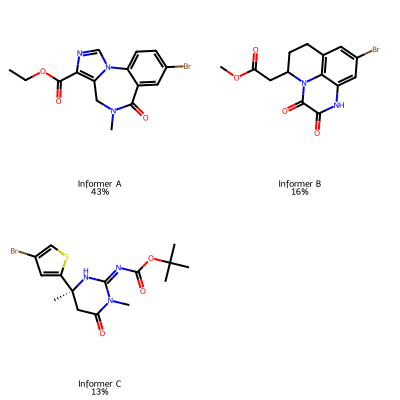

In [20]:
macmillan_bromides_mol = [Chem.MolFromSmiles(bromide) for bromide in bromides]
yields = []
for bromide in bromides:
    av_yield = df_labelled[df_labelled.index.str.startswith(bromide)]["yield"].mean()
    yields.append(av_yield)
    summary.loc[names[bromide],"Yields"] = av_yield
print("The three informers that are coupled with the different acids and their average yield across all acid substrates:")
Draw.MolsToGridImage(macmillan_bromides_mol, molsPerRow=2,subImgSize=(200,200),
                     legends = [f"{name}\n{round(float(result))}%" for name,result in zip(names.values(),yields)])

Define a function to summarize the substrate selections

In [21]:
# define the function
def get_selection_summary(name_results,names,directory="."):
    """Summarizes the substrate selections for a Benchmark.collect_data folder. 
    Returns the average values (df) and a dict of the results fo the different random seeds (dfs_count)."""
    # Set directory.
    wdir = Path(directory)
    # dict for dfs
    dfs_count = {}

    # get the bromide names
    df_labelled = pd.read_csv("./../XEC_data/Datasets/xec_dft_data_acid_scope.csv",index_col=0,header=0)
    bromides = list(set([combi.split(".")[0] for combi in df_labelled.index]))

    raw_path = wdir.joinpath(name_results+"/raw_data/")
    for file in os.listdir(raw_path):
        df_data = pd.read_csv(wdir.joinpath(name_results+"/raw_data/"+file), index_col=0,header=0)
        df_data["eval_samples"] = df_data["eval_samples"].apply(lambda x: [y.strip("'") for y in x[1:-1].split(', ')])
        # reindex from zero- to one-indexing
        df_data.index = [idx+1 for idx in df_data.index]

        df_results = pd.DataFrame(0, index = df_data.index, columns = bromides)

        for run_round in df_data.index:
            # get the substrate combinations
            round_bromides = [combi.split(".")[0] for combi in df_data.loc[run_round,"eval_samples"]]
            for bromide in round_bromides:
                df_results.loc[run_round,bromide] = round_bromides.count(bromide)

        seed = int(file.split("_")[-1].split(".")[0][1:])
        df_results = df_results.rename(columns=names)
        df_results = df_results[df_results.columns.sort_values()]
        dfs_count[seed] = df_results
    df = pd.concat(dfs_count.values()).groupby(level=0).mean()

    return df, dfs_count

# run the function
df, dfs_count = get_selection_summary("./Results_Data/comb_scope/scope_ei_with-pruning",names)
summary["Dist ScopeBO"] = df.sum(axis=0) 

Define some plots for data visualization

In [22]:
# sort colors to preferred order
plot_colors = [all_colors[1], all_colors[0], all_colors[2]]

def selection_progress_plot(df, dfs_count,title_addition, plot_colors = plot_colors, 
                            ax = None, suppress_labels = (False,False), suppress_title = False, 
                            suppress_legend = False):

    if ax is None:
        fig, ax = plt.subplots(figsize=(6, 4),
                            #    dpi=600
                               )

    smiles_list = df.columns
    smiles_colors = {}

    # calculate the standard deviation
    std_dict = {}
    for smi in smiles_list:
        all_vals = np.array([dfs[smi].values for dfs in dfs_count.values()])
        std_dict[smi] = np.std(all_vals, axis=0)

    # go through the three informers
    for i,smi in enumerate(smiles_list):
        x = df.index.values
        y = df[smi].values
        yerr = std_dict[smi]

        # clip the error bars at 0
        lower_err = np.minimum(yerr, y)
        upper_err = yerr
        yerr_clipped = [lower_err, upper_err]

        # smooth line between the points
        x_smooth = np.linspace(x.min(), x.max(), 300)
        pchip = PchipInterpolator(x, y)
        y_smooth = pchip(x_smooth)

        # plot line
        color = plot_colors[i]
        ax.plot(x_smooth, y_smooth, lw=2, label=list(names.values())[i], color = color)
        smiles_colors[smi] = color

        ax.fill_between(x_smooth, 0, y_smooth, color=color, alpha=0.2)
        ax.scatter(x, y, s=40, color=color, alpha=1.0, edgecolor='k', zorder=3)
        ax.errorbar(
            x, y, yerr=yerr_clipped, fmt='none', color=color,
            ecolor=color, elinewidth=1.5, alpha=0.5, capsize=3, zorder=2)

    if not suppress_labels[0]:
        ax.set_xlabel("Round of experiments")
    if not suppress_labels[1]:
        ax.set_ylabel("Number of selections")
    if not suppress_title:
        ax.set_title(f"{title_addition}")
    if not suppress_legend:
        ax.legend(loc = "upper left")

    return ax, smiles_colors


def boxplot_with_jitter(df, dfs_count, plot_colors=plot_colors, title = "Distribution of substrate selections"):

    # data preparation
    box_data = []
    for smi in df.columns:
        sums = np.array([dfs[smi].sum() for dfs in dfs_count.values()])
        box_data.append(sums)

    plt.figure(figsize=(5, 6))
    bp = plt.boxplot(
        box_data,
        patch_artist=True,
        showmeans=False,
        showfliers=False)

    # Color box faces
    for i, box in enumerate(bp['boxes']):
        box.set_facecolor(plot_colors[i])
        box.set_edgecolor('black')
        box.set_linewidth(1.2)

    # Whiskers / medians
    for whisker in bp['whiskers']:
        whisker.set_color('black')
    for cap in bp['caps']:
        cap.set_color('black')
    for median in bp['medians']:
        median.set_color('black')
        median.set_linewidth(1.5)

    # jitter points
    for i, values in enumerate(box_data):
        x_center = i + 1  # Matplotlib boxplot positions start at 1
        jitter = np.random.normal(0, 0.05, size=len(values))  # jitter amount
        plt.scatter(
            np.full(len(values), x_center) + jitter,
            values,
            color='black',
            s=10,
            alpha=0.6,
            zorder=3)

    plt.xticks(
        ticks=np.arange(1, len(df.columns)+1),
        labels=names.values(),
        rotation=90)
    plt.ylabel("Substrate selections")
    plt.ylim(0,25)
    plt.title(title)
    plt.tight_layout()
    plt.show()

Results with ScopeBO

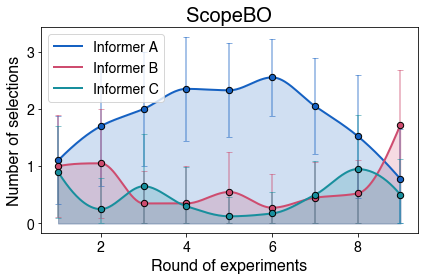

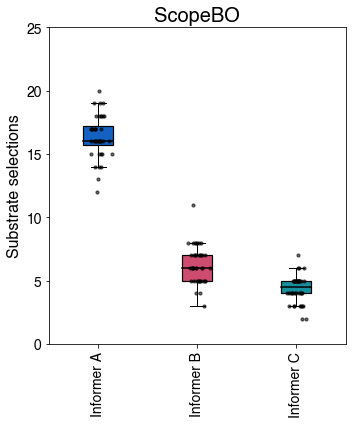

Total selections per informer:


Informer A    16.375
Informer B     6.275
Informer C     4.350
dtype: float64

In [23]:
_, smiles_colors  = selection_progress_plot(df,dfs_count,"ScopeBO")
plt.tight_layout()
plt.show()
boxplot_with_jitter(df,dfs_count, title = "ScopeBO")
print("Total selections per informer:")
df.sum()

In [24]:
print("Selections with ScopeBO per round")
df.applymap(lambda x: round(x,2))

Selections with ScopeBO per round


,Informer A,Informer B,Informer C
1,1.10,1.00,0.90
2,1.70,1.05,0.25
3,2.00,0.35,0.65
4,2.35,0.35,0.30
5,2.33,0.55,0.12
6,2.55,0.28,0.17
7,2.05,0.45,0.50
8,1.52,0.53,0.95
9,0.78,1.73,0.50


In [25]:
print("Standard deviation of selections with ScopeBO per round")
std_dict = {}
for smi in df.columns:
    all_vals = np.array([dfs[smi].values for dfs in dfs_count.values()])
    std_dict[smi] = np.std(all_vals, axis=0)
std_df = pd.DataFrame.from_dict(std_dict)
std_df.index = list(range(1,10,1))
std_df.applymap(lambda x: round(x,2))

Standard deviation of selections with ScopeBO per round


,Informer A,Informer B,Informer C
1,0.77,0.89,0.80
2,1.05,0.95,0.54
3,1.00,0.57,0.91
4,0.91,0.65,0.68
5,0.82,0.71,0.33
6,0.67,0.59,0.38
7,0.84,0.63,0.59
8,1.07,0.59,0.95
9,0.88,0.95,0.63


Results with regular BO (EI)

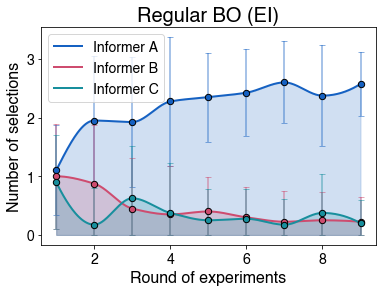

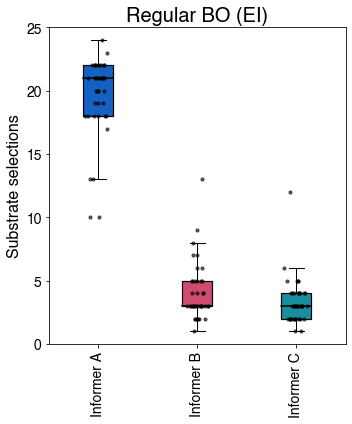

Total selections with regular BO:


Informer A    19.575
Informer B     4.075
Informer C     3.350
dtype: float64

In [26]:
df,dfs_count = get_selection_summary("./Results_Data/comb_scope/scope_ei_no-pruning",names)
summary["Dist EI"] = df.sum(axis=0)
_,_ = selection_progress_plot(df,dfs_count,"Regular BO (EI)")
boxplot_with_jitter(df,dfs_count, title = "Regular BO (EI)")
print("Total selections with regular BO:")
df.sum(axis=0)

In [27]:
print("Selections with EI per round")
df.applymap(lambda x: round(x,2))

Selections with EI per round


,Informer A,Informer B,Informer C
1,1.10,1.00,0.90
2,1.95,0.88,0.17
3,1.93,0.45,0.62
4,2.27,0.35,0.38
5,2.35,0.40,0.25
6,2.42,0.30,0.28
7,2.60,0.23,0.17
8,2.38,0.25,0.38
9,2.58,0.23,0.20


In [28]:
print("Standard deviation of selections with EI per round:")
std_dict = {}
for smi in df.columns:
    all_vals = np.array([dfs[smi].values for dfs in dfs_count.values()])
    std_dict[smi] = np.std(all_vals, axis=0)
    std_df = pd.DataFrame.from_dict(std_dict)
std_df.index = list(range(1,10,1))
std_df.applymap(lambda x: round(x,2))

Standard deviation of selections with EI per round:


,Informer A,Informer B,Informer C
1,0.77,0.89,0.80
2,1.09,1.00,0.63
3,1.10,0.86,0.89
4,1.10,0.82,0.86
5,0.76,0.58,0.54
6,0.74,0.51,0.50
7,0.70,0.52,0.44
8,0.86,0.49,0.66
9,0.54,0.42,0.40


Print them together for the manuscript

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


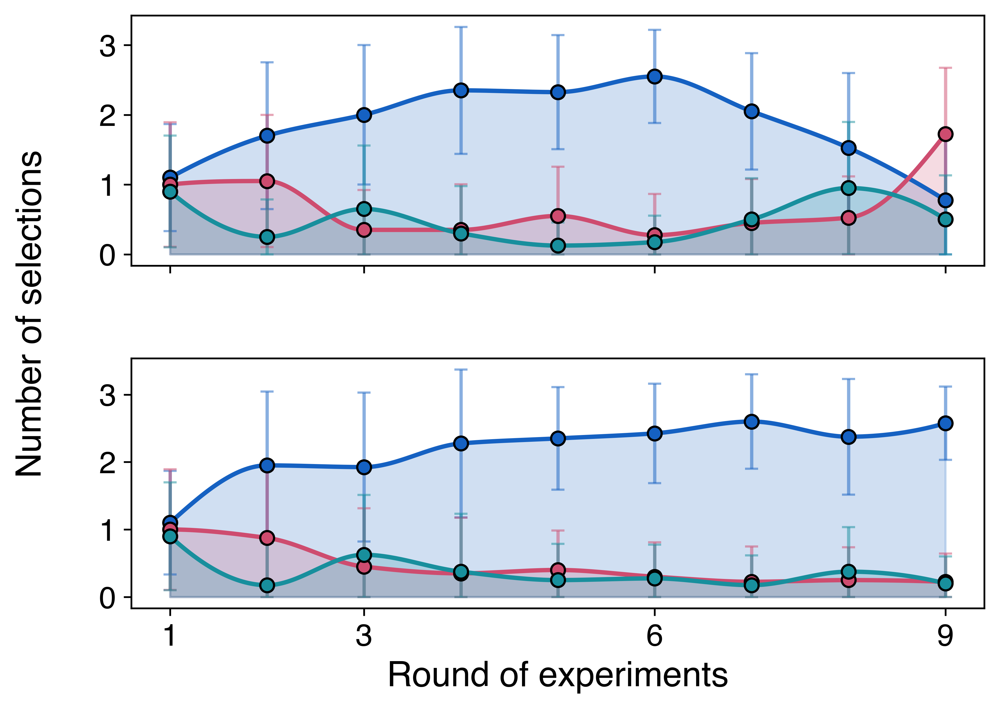

In [29]:
fig, axs = plt.subplots(2, 1, figsize=(7, 5), 
                        dpi=600, 
                        sharex=True, gridspec_kw={"hspace": 0.37})

folder_scopebo = "./Results_Data/comb_scope/scope_ei_with-pruning"
folder_ei = "./Results_Data/comb_scope/scope_ei_no-pruning"
data_scopebo = get_selection_summary(folder_scopebo,names)
data_ei = get_selection_summary(folder_ei,names)

_,_ = selection_progress_plot(data_scopebo[0], data_scopebo[1], "ScopeBO", plot_colors, ax=axs[0],
                        suppress_labels=(True,True), suppress_title=True, suppress_legend= True)
_,_ = selection_progress_plot(data_ei[0], data_ei[1], "Regular BO (EI)", plot_colors, ax=axs[1], 
                        suppress_labels=(False,True), suppress_title=True, suppress_legend = True)
fig.supylabel("Number of selections",fontsize=16)
plt.xticks([1,3,6,9])
plt.tight_layout()
plt.show()

Comparison between ScopeBO and EI

In [30]:
print("Total values:")
summary

Total values:


,Dist ScopeBO,Dist EI,Yields
Informer A,16.375,19.575,42.964746
Informer B,6.275,4.075,16.072881
Informer C,4.350,3.350,12.531864


In [31]:
summ_norm = summary.copy()
print("Relative ratios:")
summ_norm["Dist ScopeBO"] = summ_norm["Dist ScopeBO"]/summ_norm["Dist ScopeBO"].min()
summ_norm["Dist EI"] = summ_norm["Dist EI"]/summ_norm["Dist EI"].min()
summ_norm["Yields"] = summ_norm["Yields"]/summ_norm["Yields"].min()
summ_norm.applymap(lambda x: round(x,1))

Relative ratios:


,Dist ScopeBO,Dist EI,Yields
Informer A,3.8,5.8,3.4
Informer B,1.4,1.2,1.3
Informer C,1.0,1.0,1.0


Stacked yields with indicated ratios


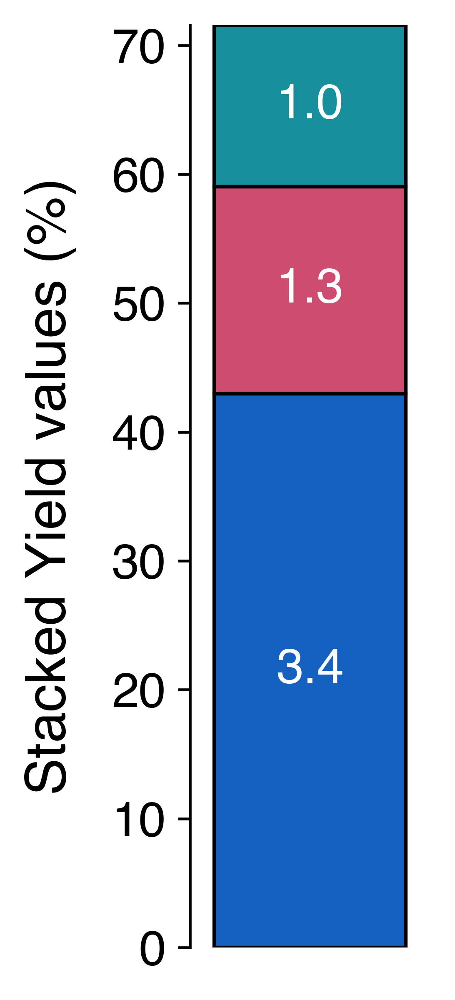

In [32]:
print("Stacked yields with indicated ratios")

values = summary["Yields"].to_numpy()
labels = summary.index.to_numpy()

plt.figure(figsize=(1.62, 3.8),
           dpi=600
           )
x_pos = 0
bottom = 0

# Compute ratios (smallest bar = 1.0)
ratios = values / values.min()

for i in range(len(values)):
    height = values[i]
    color = plot_colors[i]

    # Draw the bar
    plt.bar(
        x_pos, height, width = 0.8,
        color=color, alpha=1, edgecolor='k',
        bottom=bottom, label=labels[i]
    )

    # Add centered label
    plt.text(
        x_pos,
        bottom + height / 2,
        f"{ratios[i]:.1f}",
        ha='center', va='center', fontsize=14, color='white'
    )

    bottom += height

plt.xlim(-0.5, 0.5)
plt.ylim(0, bottom)
plt.margins(x=0, y=0)

# Keep y-axis visible
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

# Keep y-axis label and ticks
plt.ylabel("Stacked Yield values (%)", fontsize=16, labelpad=10)
plt.yticks(fontsize=14)
plt.xticks([])

plt.tight_layout(pad=0)
plt.show()


Stacked selections with indicated ratios (left ScopeBO, right regular BO)


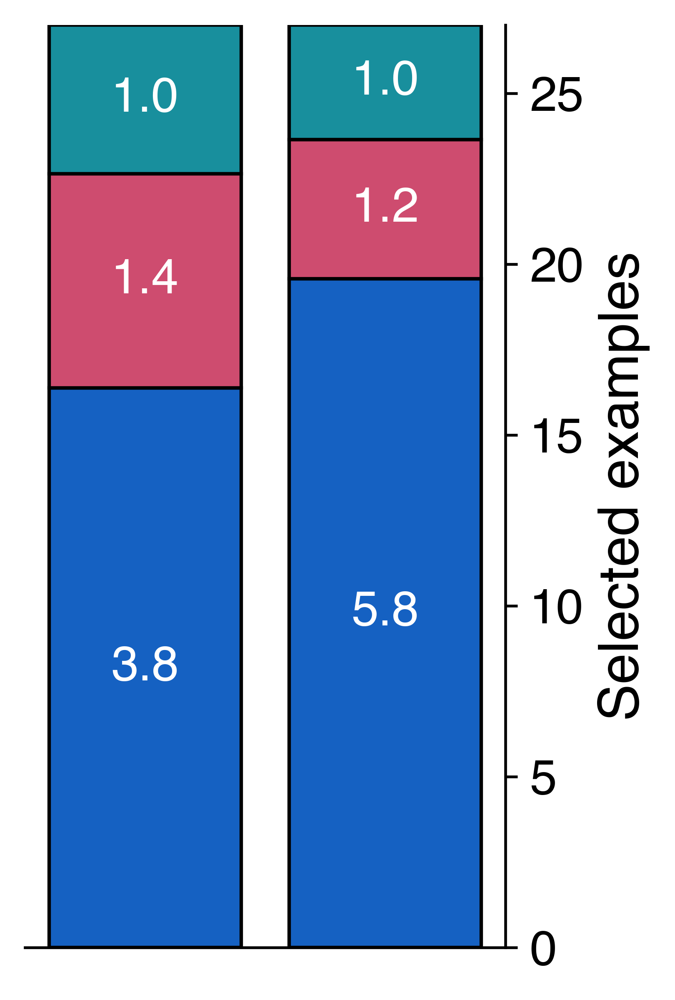

In [33]:
print("Stacked selections with indicated ratios (left ScopeBO, right regular BO)")

values_scopebo = summary["Dist ScopeBO"].values
values_ei = summary["Dist EI"].values
labels = summary.index

n = len(values_scopebo)
x = np.arange(2)
width = 0.8

plt.figure(figsize=(2.5, 3.8)
           ,dpi=600
           )

# Initialize stacking heights
bottom_scopebo = 0
bottom_ei = 0

ratios_scopebo = values_scopebo / values_scopebo.min()
ratios_ei = values_ei / values_ei.min()

# --- Plot ---
for i in range(n):
    # EI stack
    plt.bar(
        x[1], values_ei[i], width=width, bottom=bottom_ei,
        edgecolor="k", color=smiles_colors[labels[i]], alpha=1
    )
    plt.text(
        x[1],
        bottom_ei + values_ei[i] / 2,
        f"{ratios_ei[i]:.1f}", color = "white",
        ha='center', va='center', fontsize=14
    )
    bottom_ei += values_ei[i]

    # ScopeBO stack
    plt.bar(
        x[0], values_scopebo[i], width=width, bottom=bottom_scopebo,
        edgecolor='k', color=smiles_colors[labels[i]], alpha=1,
        label=labels[i] if i == 0 else ""
    )
    plt.text(
        x[0],
        bottom_scopebo + values_scopebo[i] / 2,
        f"{ratios_scopebo[i]:.1f}", color = "white",
        ha='center', va='center', fontsize=14
    )
    bottom_scopebo += values_scopebo[i]

plt.ylim(0, max(bottom_scopebo, bottom_ei))
plt.xlim(-0.5, 1.5)
plt.margins(x=0, y=0)
plt.xticks([])

# Move y-axis to right
ax = plt.gca()
ax.yaxis.tick_right()
ax.yaxis.set_label_position("right")
plt.yticks(fontsize=14)
plt.ylabel("Selected examples", fontsize=16)

# Remove extra spines
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.tight_layout(pad=0)
plt.show()


The substrate selection ratios with ScopeBO are similar to the average yield ratios. Regular BO however oversamples the most promising informer bromide. Viewing the progress plots, this is likely because there is no Vendi pruning in regular BO which forces the algorithm to select substrate combinations with other informers.

### Comparison of different scope selection strategies

In the scope above with the optimized scope size of 27 samples, we select samples from the combinatorial reaction space of the three aryl bromides and the 295 acids. For comparison, we also generated scopes by running smaller scopes of 9 samples for each aryl bromide. Here, the aryl bromides are evaluated individually with the same total experimental budget. Additionally, we also imagined a scenario in which the aryl bromides are again evaluated separately, but knowledge from the scopes of the already evaluated aryl bromides was used to seed the algorithm. For this second scenario, we evaluated all 6 different order permutations (A-B-C, A-C-B, etc.).

In [34]:
# generate datasets for the individual aryl bromides by splitting the combined dataset
dfs_subsets = {}
informer_labels = [label[-1] for _,label in names.items()]  # labels A, B, C for the informers
for smiles, label in names.items():
    df_subset = df_labelled.copy()
    df_subset = df_subset.loc[[idx for idx in df_subset.index if smiles in idx]]
    dfs_subsets[label] = df_subset
    # save with label for the informer (names.values are "Informer X" (whereas X in [A,B,C] --> last letter is identifier))
    df_subset.to_csv(f"./../XEC_data/Datasets/xec_dft_data_acid{label[-1]}.csv", index=True, header=True) 

Run the mini-scopes for the parallel evaluation

In [35]:
# # now we can run mini 9-sample scopes for each informer bromide
# for label in informer_labels:
#     Benchmark().collect_data(
#         filename_labelled = f"./../XEC_data/Datasets/xec_dft_data_acid{label}.csv",
#         name_results = f"./Results_Data/indiv_scope/parallel/inf_{label}",
#         objectives=['yield'],
#         budget = 9,  # only run the mini scope of 9 samples
#         batches= [3],
#         Vendi_pruning_fractions = [13],
#         seeds = 40,
#         acquisition_function_mode= "balanced",
#         pruning_metric= "vendi_batch",
#         init_sampling_method="random")

In [36]:
# can now combine these parallel mini scopes into combined scopes
for seed in range(40):
    # fetch the results for the individual scopes using the same random seed
    df_list = []
    for label in informer_labels:
        df = pd.read_csv(f"./Results_Data/indiv_scope/parallel/inf_{label}"\
                         f"/raw_data/9balanced_b3_V13_s{seed}.csv", 
                         index_col=0)
        df_list.append(df)
    # combine into a shared scope file
    df_comb = pd.concat(df_list)
    df_comb = df_comb.reset_index(drop=True)  # reset the index, drop the old one
    
    # the Vendi scores need to be recalculated to account for all data that was selected (not just one mini scope)
    df_comb["eval_samples"] = df_comb["eval_samples"].apply(lambda x: [y.strip("'") for y in x[1:-1].split(', ')])
    df_comb["Vendi_score"] = np.nan
    Vendi_scores = []

    # calculate the covariance matrix
    df_labelled.sort_index(inplace=True)
    cov_mat = obtain_full_covar_matrix(objectives=["yield"],directory=".",filename="./../XEC_data/Datasets/xec_dft_data_acid_scope.csv")

    # reset the labels in the search space dataframe
    df_Vendi = df_labelled.copy()
    df_Vendi["yield"] = "PENDING"

    # loop through the rounds of the run
    for run_round in df_comb.index:
            # get the evaluated samples
            samples = df_comb.loc[run_round,"eval_samples"]
            # record the evaluated samples in the df for the Vendi score calculation
            for sample in samples:
                sample = str(sample.encode().decode('unicode_escape'))
                df_Vendi.loc[sample,"yield"] = df_labelled.loc[sample,"yield"]
            # sort to assert that df_Vendi has the required order as the cov_mat
            df_Vendi.sort_index(inplace=True)

            # calculate the Vendi score and save it
            idx_target = (df_Vendi[~df_Vendi.apply(lambda r: r.astype(str).str.contains('PENDING', case=False).any(), axis=1)]).index.values
            idx_num = [df_Vendi.index.get_loc(idx) for idx in idx_target]
            current_Vendi_score = calculate_vendi_score(idx_num=idx_num,covariance_matrix=cov_mat)
            Vendi_scores.append(current_Vendi_score)

    # overwrite the Vendi scores in the df
    df_comb["Vendi_score"] = Vendi_scores
    os.makedirs(wdir.joinpath("./Results_Data/indiv_scope/parallel/comb/raw_data/"), exist_ok=True)
    df_comb.to_csv(f"./Results_Data/indiv_scope/parallel"\
                   f"/comb/raw_data/comb_par_scope_s{seed}.csv", index=True, header=True)

Set up the consecutive scope runs

In [37]:
# to run the scopes in which the informers are evaluated consecutively and each evaluation is seeded with the results for the prior 
# informer(s), we extended the dataset for the respective informer with the data for the evaluated samples of the prior informer(s)

# there is no prior informer when the first informer is evaluated. We can therefore directly use the data from the parallel 
# evaluation we just did
run_orders = ["ABC", "ACB", "BAC", "BCA", "CAB", "CBA"]  # orders in which the informers can be run

for order in run_orders:
    # get the first informer of the order
    first_inf = order[0]
    # copy the results
    source_dir = f"./Results_Data/indiv_scope/parallel/inf_{first_inf}/raw_data"
    target_dir = f"./Results_Data/indiv_scope/consecutive/{order}/1_inf_{first_inf}"
    os.makedirs(target_dir, exist_ok=True)
    shutil.copytree(source_dir, target_dir, dirs_exist_ok=True)
    print(f"Copied data for informer {first_inf} into the folder for the run order {order}.")

Copied data for informer A into the folder for the run order ABC.
Copied data for informer A into the folder for the run order ACB.
Copied data for informer B into the folder for the run order BAC.
Copied data for informer B into the folder for the run order BCA.
Copied data for informer C into the folder for the run order CAB.
Copied data for informer C into the folder for the run order CBA.


Do the consecutive scope runs

In [38]:
# run the second and third informers of the consecutive scopes; hot-start using the prior results
# NOTE: The actual run functions have been commented out after running them to avoid reruns in later executions of the notebook

for seed in range(40):
    for order in run_orders:  # loop through all order permutations
        first_inf = order[0]
        sec_inf = order[1]
        third_inf = order[2]

        # get the experimental data for the first informer for the specific random seed
        data_first = pd.read_csv(f"./Results_Data/indiv_scope/parallel/inf_{first_inf}/raw_data/9balanced_b3_V13_s{seed}.csv",
                                 index_col=0)
        data_first["eval_samples"] = data_first["eval_samples"].apply(lambda x: [y.strip("'") for y in x[1:-1].split(', ')])

        # Get the selected samples
        idx_first = []
        for idx in data_first.index:
            for sample in data_first.loc[idx,"eval_samples"]:
               idx_first.append(sample.encode().decode('unicode_escape'))

        # get the subset of the labelled dataframe for these experimental samples
        df_eval_first = dfs_subsets[f"Informer {first_inf}"].loc[idx_first].copy()

        # concatenate with the labelled dataframe for the second informer
        df_sec = dfs_subsets[f"Informer {sec_inf}"]
        df_sec_run = pd.concat([df_sec, df_eval_first])
        df_sec_run["priority"] = 0  # if there are already experimental results, a priority column is expected
        # save for the run
        df_sec_run.to_csv("consec_run_df.csv",index=True,header=True)

        # # run the second informer mini-scope for this specific random seed
        # Benchmark().collect_data(
        #     filename_labelled = f"./consec_run_df.csv",  # use the custom dataset that was just created
        #     name_results = f"./Results_Data/indiv_scope/consecutive/{order}/2_inf_{sec_inf}",
        #     objectives=['yield'],
        #     budget = 9,  # only run the mini scope of 9 samples
        #     batches= [3],
        #     Vendi_pruning_fractions = [13],
        #     idx_to_keep= idx_first,  # hot-start the scope with the results from the first informer
        #     specific_seed= seed,  # only run this random seed
        #     acquisition_function_mode= "balanced",
        #     pruning_metric= "vendi_batch",
        #     init_sampling_method="random")
        
        # get the results for the second informer
        data_sec = pd.read_csv(f"./Results_Data/indiv_scope/parallel/inf_{sec_inf}/raw_data/9balanced_b3_V13_s{seed}.csv",
                                 index_col=0)
        data_sec["eval_samples"] = data_sec["eval_samples"].apply(lambda x: [y.strip("'") for y in x[1:-1].split(', ')])
        idx_sec = []
        for idx in data_sec.index:
            for sample in data_sec.loc[idx,"eval_samples"]:
               idx_sec.append(sample.encode().decode('unicode_escape'))
        df_eval_sec = dfs_subsets[f"Informer {sec_inf}"].loc[idx_sec].copy()

        # concatenate all prior results with the labelled dataframe for the third informer
        df_third = dfs_subsets[f"Informer {third_inf}"]
        df_third_run = pd.concat([df_third, df_eval_first, df_eval_sec])
        df_third_run["priority"] = 0  # if there are already experimental results, a priority column is expected
        # save for the run
        df_third_run.to_csv("consec_run_df.csv",index=True,header=True)

        # # run the third informer mini-scope for this specific random seed
        # Benchmark().collect_data(
        #     filename_labelled = f"./consec_run_df.csv",
        #     name_results = f"./Results_Data/indiv_scope/consecutive/{order}/3_inf_{third_inf}",
        #     objectives=['yield'],
        #     budget = 9,  # only run the mini scope of 9 samples
        #     batches= [3],
        #     Vendi_pruning_fractions = [13],
        #     idx_to_keep= idx_first + idx_sec,  # hot-start the scope with the results from the first two informers
        #     specific_seed= seed,  # only run this random seed
        #     acquisition_function_mode= "balanced",
        #     pruning_metric= "vendi_batch",
        #     init_sampling_method="random")

In [39]:
# # NOTE: Cell commented out because it takes some time to rerun
# # we can now combine these consecutive mini scopes into combined scopes
# for seed in range(40):
#     for order in run_orders:
#         # fetch the results for the individual scopes using the same random seed
#         df_list = []
#         for i in range(len(order)):
#             j = i + 1 # account for 1 indexing of the informer mini scopes
#             df = pd.read_csv(f"./Results_Data/indiv_scope/consecutive/{order}/{j}_inf_{order[i]}"\
#                             f"/9balanced_b3_V13_s{seed}.csv", 
#                             index_col=0)
#             df_list.append(df)
#         # combine into a shared scope file
#         df_comb = pd.concat(df_list)
#         df_comb = df_comb.reset_index(drop=True)  # reset the index, drop the old one

#         # the Vendi scores need to be recalculated to account for all data that was selected (not just one mini scope)
#         df_comb["eval_samples"] = df_comb["eval_samples"].apply(lambda x: [y.strip("'") for y in x[1:-1].split(', ')])
#         df_comb["Vendi_score"] = np.nan
#         Vendi_scores = []

#         # calculate the covariance matrix
#         df_labelled.sort_index(inplace=True)
#         cov_mat = obtain_full_covar_matrix(objectives=["yield"],directory=".",filename="./../XEC_data/Datasets/xec_dft_data_acid_scope.csv")

#         # reset the labels in the search space dataframe
#         df_Vendi = df_labelled.copy()
#         df_Vendi["yield"] = "PENDING"

#         # loop through the rounds of the run
#         for run_round in df_comb.index:
#                 # get the evaluated samples
#                 samples = df_comb.loc[run_round,"eval_samples"]
#                 # record the evaluated samples in the df for the Vendi score calculation
#                 for sample in samples:
#                     sample = str(sample.encode().decode('unicode_escape'))
#                     df_Vendi.loc[sample,"yield"] = df_labelled.loc[sample,"yield"]
#                 # sort to assert that df_Vendi has the required order as the cov_mat
#                 df_Vendi.sort_index(inplace=True)

#                 # calculate the Vendi score and save it
#                 idx_target = (df_Vendi[~df_Vendi.apply(lambda r: r.astype(str).str.contains('PENDING', case=False).any(), axis=1)]).index.values
#                 idx_num = [df_Vendi.index.get_loc(idx) for idx in idx_target]
#                 current_Vendi_score = calculate_vendi_score(idx_num=idx_num,covariance_matrix=cov_mat)
#                 Vendi_scores.append(current_Vendi_score)

#         # overwrite the Vendi scores in the df
#         df_comb["Vendi_score"] = Vendi_scores

#         # create target directory if it doesn't exist
#         target_path = wdir / f"./Results_Data/indiv_scope/consecutive/{order}/comb/raw_data"
        
#         if not os.path.exists(target_path):
#             # Create the folder
#             os.makedirs(target_path)

#         df_comb.to_csv(target_path / f"comb_consec_scope_s{seed}.csv", index=True, header=True)

With the separately run aryl bromide scopes in hand (both parallel and consecutive evaluation), we can compare the performance to the combinatorial scope.

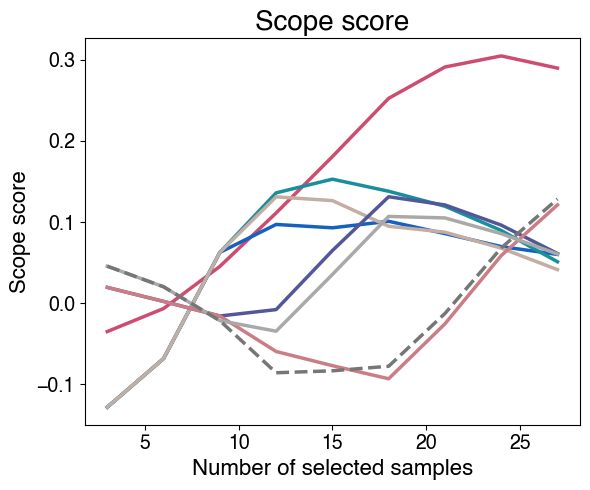

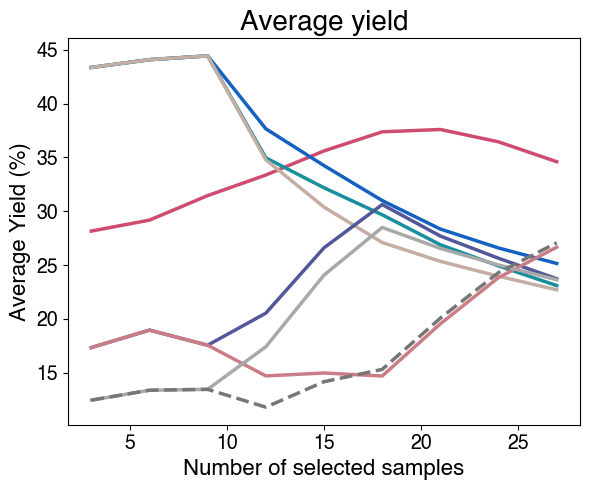

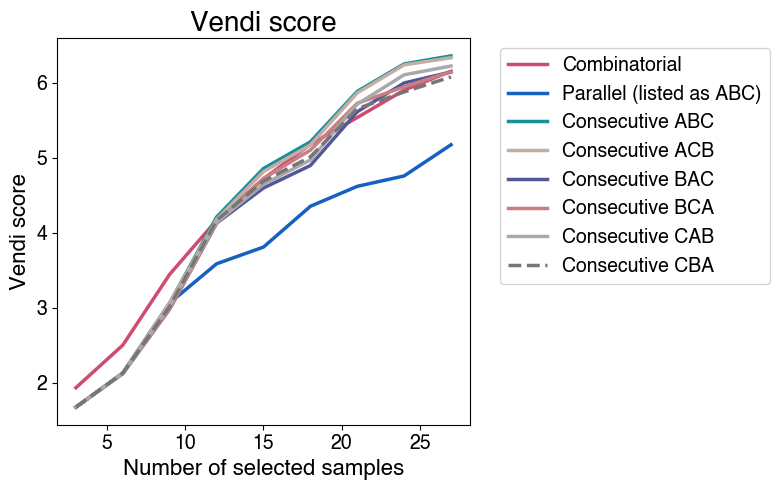

In [40]:
# get the paths of all results folders that we want to compare
results_dir = {"Combinatorial": "./Results_Data/comb_scope/scope_ei_with-pruning/"}
results_dir["Parallel (listed as ABC)"] = "./Results_Data/indiv_scope/parallel/comb/"
for order in run_orders:
    results_dir[f"Consecutive {order}"] = f"./Results_Data/indiv_scope/consecutive/{order}/comb/"

# get the results
dfs_selection_means = {}
dfs_selection_stdev = {}
for type_results in ["Scope", "Yield", "Vendi"]:
    width = 6
    if type_results == "Vendi":
        width = 8
    plt.figure(figsize=(width,5),dpi=100)
    for selection_method,folder in results_dir.items():
        dfs_progress = Benchmark().progress_plot(budget=27, type_results=type_results, name_results=folder, specified_batch_size=3,
                                                 bounds={"yield":yield_bounds,"vendi":vendi_bounds}, show_plot=False)
        dfs_selection_means[selection_method+f"_{type_results}"] = dfs_progress["means"]
        dfs_selection_stdev[selection_method+f"_{type_results}"] = dfs_progress["stdev"]
    df_combined = pd.concat(dfs_selection_means,axis=1)
    df_combined.columns = [multiindex[0] for multiindex in df_combined.columns]
    df_plotting = df_combined[[col for col in df_combined.columns if type_results in col]].copy()
    for j,col in enumerate(df_plotting.columns):
        style = '-' if j <= 6 else '--' if j <= 13 else ':'
        plot = df_plotting[col][df_plotting[col].notna()]
        plt.plot(plot.index, plot.values, label = col.split("_")[0], color=all_colors[j], linestyle=style, linewidth=2.5)
    plt.xlabel('Number of selected samples')
    plt.ylabel(f"{type_results} score")
    if type_results == "Yield":
        plt.title("Average yield")
        plt.ylabel("Average Yield (%)")
    else:
        plt.title(f"{type_results} score")
    if type_results == "Vendi":
        plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
    plt.tight_layout()
    plt.show()



Barplots with standard deviation

In [41]:
final_metrics = pd.DataFrame(np.nan, index = results_dir.keys(), 
                             columns = [type_results+suffix for type_results,suffix 
                                        in itertools.product(["Scope","Yield","Vendi"],["_mean","_stdev"])])

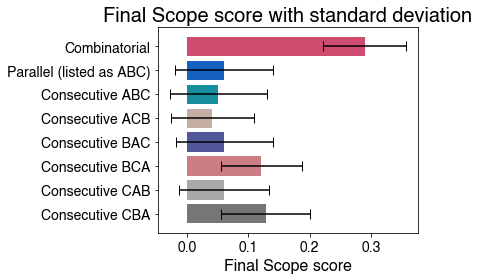

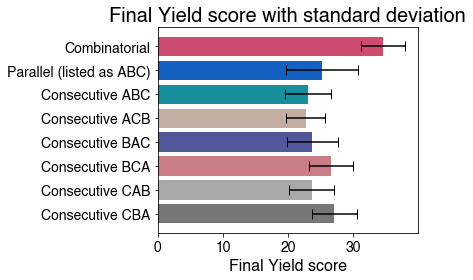

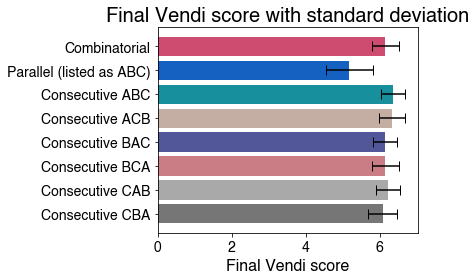

,Scope_mean,Scope_stdev,Yield_mean,Yield_stdev,Vendi_mean,Vendi_stdev
Combinatorial,0.290,0.067,34.598,3.389,6.150,0.366
Parallel (listed as ABC),0.060,0.080,25.152,5.545,5.171,0.639
Consecutive ABC,0.051,0.079,23.102,3.532,6.355,0.320
Consecutive ACB,0.041,0.068,22.712,2.994,6.330,0.355
Consecutive BAC,0.061,0.079,23.732,3.891,6.141,0.333
Consecutive BCA,0.121,0.066,26.664,3.378,6.143,0.361
Consecutive CAB,0.061,0.073,23.644,3.468,6.220,0.312
Consecutive CBA,0.128,0.073,27.074,3.434,6.075,0.394
Av. Consecutive,0.077,0.073,24.488,3.450,6.211,0.346


In [42]:
for type_results in ["Scope", "Yield", "Vendi"]:
    labels = list(results_dir.keys())
    final_means = [df.iloc[-1].values[0] for k,df in dfs_selection_means.items() if type_results in k]
    final_stdev = [df.iloc[-1].values[0] for k,df in dfs_selection_stdev.items() if type_results in k]

    final_metrics[type_results+"_mean"] = final_means
    final_metrics[type_results+"_stdev"] = final_stdev

    # Create the horizontal bar plot
    y_pos = np.arange(len(labels))
    plt.barh(y_pos, final_means, xerr=final_stdev, align='center', color=all_colors, ecolor='black', capsize=5)
    plt.yticks(y_pos, labels)
    plt.xlabel(f'Final {type_results} score')
    plt.title(f'Final {type_results} score with standard deviation')

    plt.gca().invert_yaxis()  # Optional: highest value at the top
    plt.tight_layout()
    plt.show()
final_metrics.loc["Av. Consecutive"] = final_metrics.loc[final_metrics.index.isin([idx for idx in final_metrics.index if "Consec" in idx])].mean()
final_metrics.applymap(lambda x: round(x,3))

Summarize the different consecutive scenarios

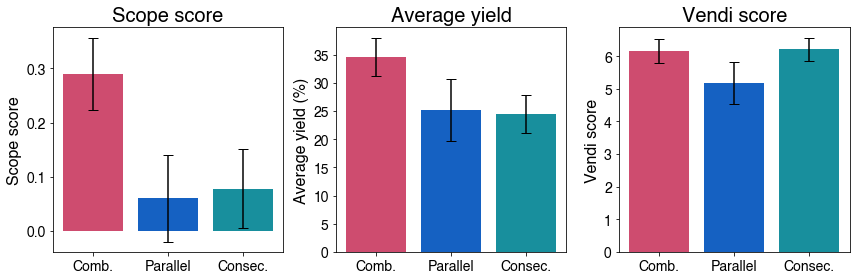

In [43]:
# Define categories
categories = ['Scope', 'Yield', 'Vendi']
titles = ['Scope score', 'Average yield', 'Vendi score']

df_plot = final_metrics.loc[["Combinatorial","Parallel (listed as ABC)", "Av. Consecutive"]].copy()
df_plot.index = ["Comb.", "Parallel", "Consec."]

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Plot each category
for i, cat in enumerate(categories):
    means = df_plot[f'{cat}_mean']
    stdevs = df_plot[f'{cat}_stdev']
    
    x = np.arange(len(df_plot))
    axes[i].bar(x, means, yerr=stdevs, capsize=5,
                color=(all_colors[0], all_colors[1], all_colors[2]))
    axes[i].set_title(titles[i])
    axes[i].set_ylabel(cat+" score")
    if cat == "Yield":
        axes[i].set_ylabel("Average yield (%)")
    axes[i].set_xticks(x)
    axes[i].set_xticklabels(df_plot.index)

plt.tight_layout()
plt.show()

Different visualization

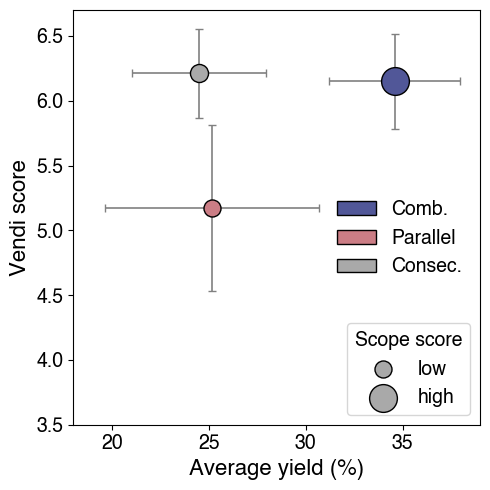

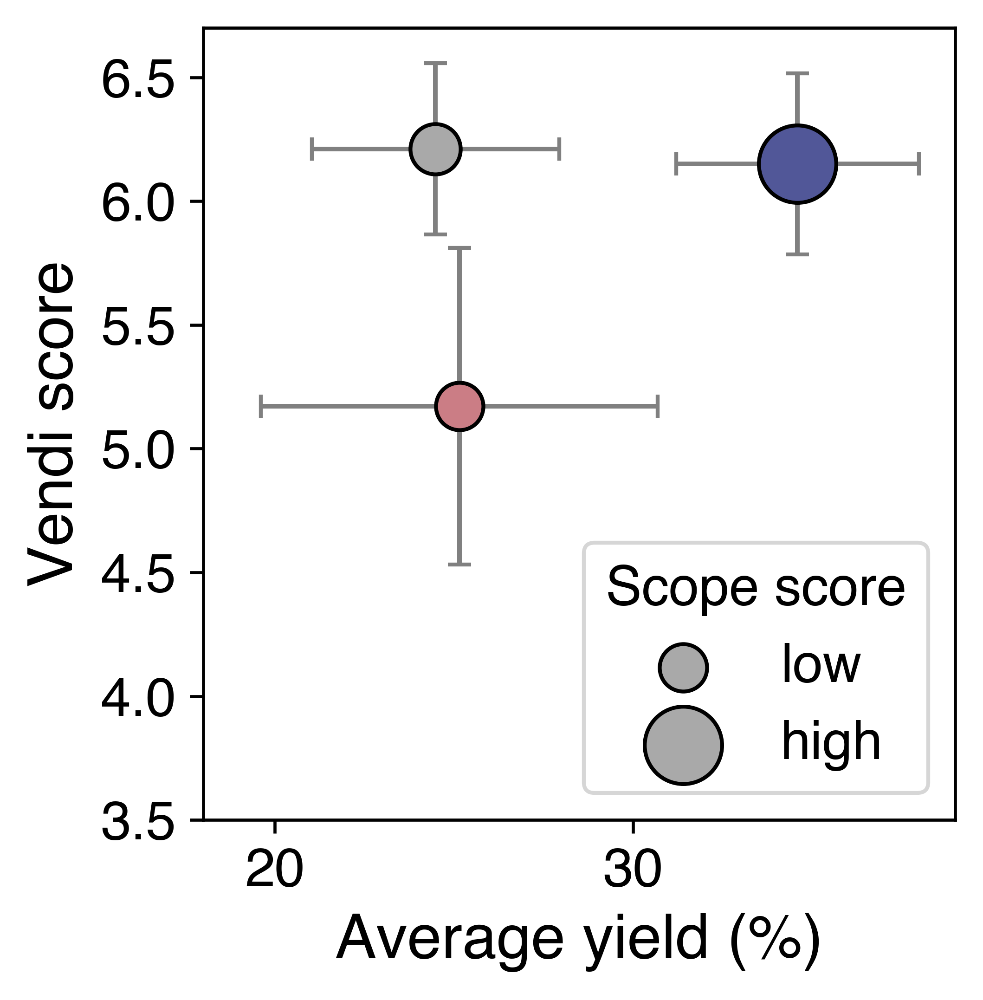

In [44]:
def performance_summary(figsize=(3.63,3.69),print_legend=True,dpi=600):

    plt.figure(figsize=figsize,dpi=dpi)
    plt.xlabel('Average yield (%)')
    plt.ylabel('Vendi score')

    # Color map for selection methods
    color_map = {"Comb.": all_colors[4], "Parallel": all_colors[5], "Consec.": all_colors[6]}

    alpha_val = 1
    z_min = df_plot["Scope_mean"].min()
    z_max = df_plot["Scope_mean"].max()
    size_min = 150
    size_max = 400

    # --- Plot each Scope method ---
    for scope_label in df_plot.index:
        # Mean values
        x = df_plot.loc[scope_label,"Yield_mean"]
        y = df_plot.loc[scope_label,"Vendi_mean"]
        z_raw = df_plot.loc[scope_label,"Scope_mean"]

        # Std values (for error bars)
        xerr = df_plot.loc[scope_label,"Yield_stdev"]
        yerr = df_plot.loc[scope_label,"Vendi_stdev"]

        # Scale bubble size
        size = size_min + (z_raw - z_min)/ (z_max - z_min) * (size_max - size_min)

        plt.errorbar(
            x, y,
            xerr=xerr, yerr=yerr,
            fmt='o',
            color=color_map[scope_label],
            ecolor='gray',
            elinewidth=1.2,
            capsize=3,
            alpha=alpha_val,
            markeredgecolor='k',
            markeredgewidth=1,
            markersize=np.sqrt(size),
            label=scope_label,
            zorder=3
        )

    # Selection methods legend
    color_handles = [
        Patch(facecolor=color_map[scope_label], edgecolor='k', label=scope_label, alpha=alpha_val)
        for scope_label in df_plot.index
    ]

    # Scope score legend
    size_labels = ["low","high"]
    size_vals = [size_min, size_max]
    size_handles = [
        plt.scatter([], [], s=s, color=all_colors[6], alpha=1, edgecolors='k', label=f'{lab}')
        for s, lab in zip(size_vals, size_labels)
    ]

    if print_legend: 
        legend_scope = plt.legend(
            handles=color_handles,
            loc='center right',
            frameon =False,
            bbox_to_anchor=(1, 0.45)
            )
        plt.gca().add_artist(legend_scope)

        
    legend_size = plt.legend(
        handles=size_handles,
        title="Scope score",
        loc='lower right',
        frameon = True)
    legend_size.get_title().set_multialignment("center")

    plt.xlim(18,39)
    plt.ylim(3.5, 6.7)

    plt.tight_layout()
    plt.show()

performance_summary(figsize=(5,5), dpi = 100)
performance_summary(print_legend=False, dpi = 600)


Reprint for manuscript

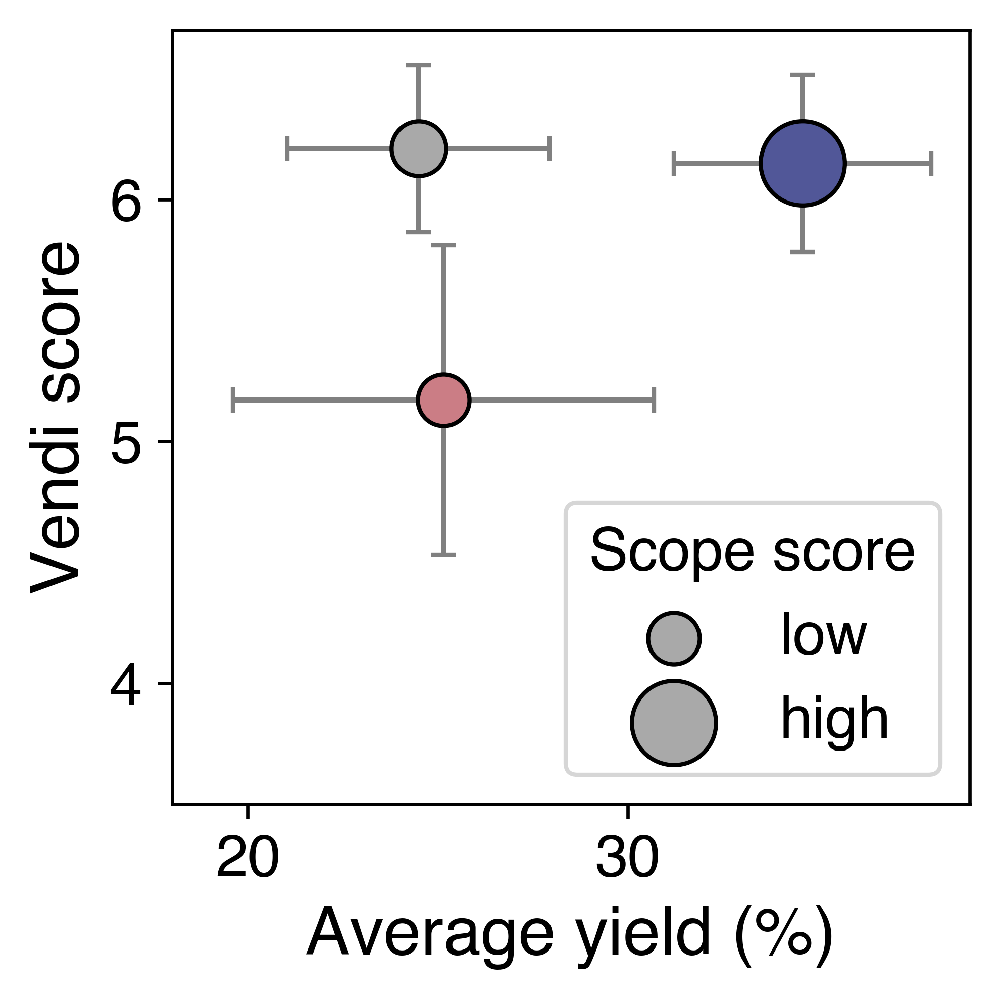

In [45]:
performance_summary(print_legend=False, dpi = 600, figsize=(3.4,3.4))


### Validation of the high performance initiation strategy

We can now evaluate the scope initiation strategy of selecting high-performing samples in the first round. This strategy was establisehd with the ArI dataset.

In [46]:
# get the data for the different random initiations

# get the data for the inidividual seeds
_, dict_raw_data = Benchmark.get_metric_overview(bounds=bounds,budget=27,type_results="scope", 
                            name_results=f"./Results_Data/comb_scope/scope_ei_with-pruning")
# dfs_raw_data[dset] contains a dict for all batch-pruning combination with another dict as 
# the value which contains the data for the random seeds
# here, we only have one combination (b3_V13 --> optimized hyperparameters)
# --> reassign dfs_raw_data[dset] for simplier handling
dfs_raw_data = dict_raw_data["b3_V13"]

In [47]:
print("Data for the first initiation as an example:")
dfs_raw_data[0]

Data for the first initiation as an example:


,vendi,yield,scope
0,1.933945,9.133333,0.048204
1,2.437980,13.133333,0.008478
2,3.505108,23.077778,0.012076
3,4.109836,28.691667,0.070487
4,4.435776,34.706667,0.151423
5,5.457015,35.177778,0.244707
6,5.725233,37.709524,0.315026
7,6.012523,40.241667,0.395732
8,6.295106,39.325926,0.408523


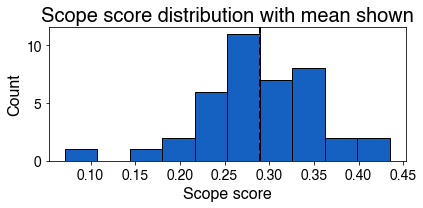

In [48]:
# get and plot the final scope scores for the inidividual seeds
nr_seeds = len(dfs_raw_data)
score_list = [dfs_raw_data[i].loc[8,"scope"] for i in range(nr_seeds)]
mean_score = np.mean(score_list)  # mean scope score

plt.figure(figsize=(6,3))
plt.title("Scope score distribution with mean shown")
plt.xlabel("Scope score")
plt.hist(score_list, color=all_colors[1], bins=10, edgecolor="k")
plt.axvline(x=mean_score, color='black', linestyle='--', linewidth=2)
plt.ylabel("Count")
plt.tight_layout()
plt.show()


In [49]:
# check: How are the final scope scores when the initiations with the highest initial average rates are regarded?
summ_top_yields = pd.DataFrame(np.nan,index=["Top5 initial av. yield", "random initiation"],
                             columns=["Mean final scope score",
                                      "Worst final scope score",
                                      "Mean initial average yield"])

In [50]:
initial_vendi = [dfs_raw_data[i].loc[0,"vendi"] for i in range(nr_seeds)]
initial_obj = [dfs_raw_data[i].loc[0,"yield"] for i in range(nr_seeds)]

summ_top_yields.loc["random initiation","Mean initial average yield"] = round(np.mean(initial_obj),3)
summ_top_yields.loc["random initiation","Mean final scope score"] = round(np.mean(np.array(score_list)),3)
summ_top_yields.loc["random initiation","Worst final scope score"] = round(np.min(np.array(score_list)),3)


# get the seeds that have the top 5 initial average rates
indexed_rates = list(enumerate(initial_obj))  # generate (index,av. yield) tuples
top_5 = sorted(indexed_rates, key=lambda x: x[1], reverse=True)[:5]  # sort by score
best_seeds = [index for index, yield_val in top_5]
print(f"Top 5 seeds by initial average yield:", best_seeds)

# get the averages of the final samples for the top 5 seeds
best_init_final_scope = [dfs_raw_data[i].loc[8,"scope"] for i in best_seeds]
best_init_yield = [initial_obj[i] for i in best_seeds]

summ_top_yields.loc["Top5 initial av. yield","Mean final scope score"] = round(np.mean(best_init_final_scope),3)
summ_top_yields.loc["Top5 initial av. yield","Worst final scope score"] = round(np.min(best_init_final_scope),3)
summ_top_yields.loc["Top5 initial av. yield","Mean initial average yield"] = round(np.mean(best_init_yield),3)

summ_top_yields

Top 5 seeds by initial average yield: [10, 4, 11, 18, 1]


,Mean final scope score,Worst final scope score,Mean initial average yield
Top5 initial av. yield,0.31,0.252,53.127
random initiation,0.29,0.071,28.161


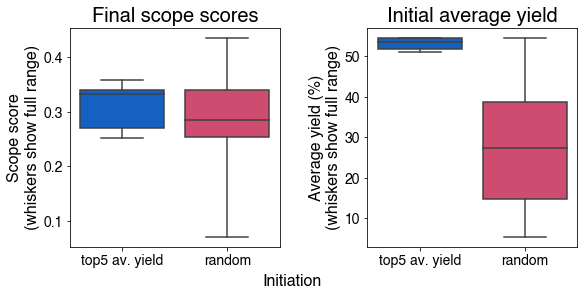

In [51]:
fig, axes = plt.subplots(1,2, figsize = (8,4),gridspec_kw={"wspace": 0.1},constrained_layout=True)
for i, results_type in enumerate(["scope","yield"]):
    ax = axes[i]
    if results_type == "scope":
        ax.set_title("Final scope scores")
    else:
        ax.set_title("Initial average yield")
    fig.supxlabel("Initiation",fontsize=16)
    if results_type == "scope":
        df = pd.DataFrame([best_init_final_scope,score_list])
    else:
        df = pd.DataFrame([best_init_yield,initial_obj])
    df_long = df.T.melt(var_name='Row', value_name='Value')
    df_long.loc[df_long["Row"] == 0,"Row"] = "top5 av. yield"
    df_long.loc[df_long["Row"] == 1,"Row"] = "random"
    palette = [all_colors[1], all_colors[0]]
    sns.boxplot(ax=ax,x='Row', y='Value', data=df_long, whis=[0,100], palette=palette, saturation=1)
    if results_type == "scope":
        ax.set_ylabel('Scope score\n(whiskers show full range)')
    elif results_type == "yield":
        ax.set_ylabel("Average yield (%)\n(whiskers show full range)")
    ax.set_xlabel("")
plt.show()

### Clustering scope using Doyle's approach

In [52]:
# Read in the labelled dataset and scale it
df_labelled = pd.read_csv("./../XEC_data/Datasets/xec_dft_data_acid_scope.csv", index_col=0,header=0)
df_data = df_labelled.copy(deep=True)
df_data = df_data.drop(columns=['yield'])  # drop the objective values
df_data = pd.DataFrame(scale(df_data),df_data.index,df_data.columns)
objectives = ["yield"]
wdir = Path(".")

# Make a UMAP for the visualization of the results
fit = UMAP(n_neighbors=40,min_dist=0.7,n_components=2,metric="euclidean",random_state=12)
df_umap = pd.DataFrame(fit.fit_transform(df_data),df_data.index,["UMAP1","UMAP2"])
df_umap.to_csv("./../XEC_data/Datasets/xec_dft_umap_acid_scope.csv")

print(f"There are {len(df_data.columns)} dimensions in the dataset.")


There are 58 dimensions in the dataset.


In [53]:
# define the dimensionalities of the reduced representation to study
dims = [58, 50, 40, 30, 25, 20, 15, 10, 5, 2]

# function to calculate silhouette scores
def silhouette_scores_hierarchical(data, n_cls_list):
    """helper function to compute a silhouette score for hierarchical clustering using Ward linkage"""
    z = linkage(data, method='ward')
    result = pd.Series(index=n_cls_list, dtype=float)
    for n_cls in n_cls_list:
        cls = fcluster(z, n_cls, criterion='maxclust')
        result.loc[n_cls] = silhouette_score(data, cls)
    return result

# dictionary to store data at different levels of dimensionality reduction
n_neighbors = int(np.sqrt(df_data.shape[1]))
dfs = {}
for dim in dims:
    key = f"umap{dim}"
    dfs[key] = pd.DataFrame(UMAP(n_components=dim, n_neighbors=n_neighbors,
                                    random_state=0).fit_transform(df_data),index=df_data.index)

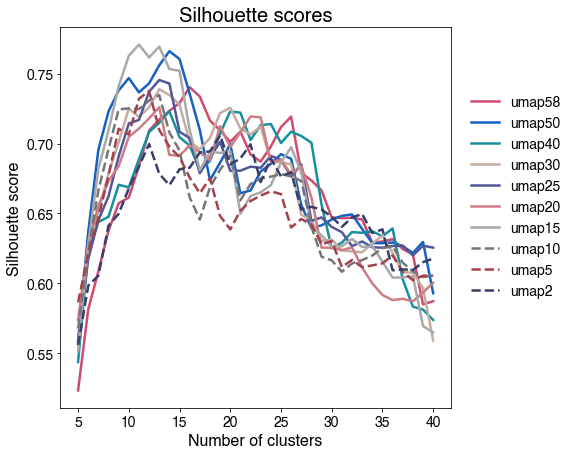

,Representation,Nr_clusters,Silh_score,Representation (min 15 clusters),Nr_clusters (min 15 clusters),Silh_score (min 15 clusters)
Results,umap15,11.0,0.770782,umap50,15.0,0.76044


In [54]:
# range of scope sizes to be studied
N_CLS_list = list(range(5,41))
# min number of clusters for the scope
min_clust = 15
# df to save the results of the silhouette score analysis
best_silh_scores = pd.DataFrame(np.nan,index=["Results"],columns=["Representation","Nr_clusters", "Silh_score",
                                                               f"Representation (min {min_clust} clusters)", 
                                                               f"Nr_clusters (min {min_clust} clusters)",
                                                               f"Silh_score (min {min_clust} clusters)"])

plt.figure(figsize=(7,7))
plt.title("Silhouette scores")
plt.xlabel("Number of clusters",fontsize=16)
plt.ylabel("Silhouette score",fontsize=16)

# populate silhouette scores for all number of clusters and all dimensionality reductions
silh_scores = pd.DataFrame(index=N_CLS_list)
for key, value in dfs.items():
    silh_scores[key] = silhouette_scores_hierarchical(value, N_CLS_list)
for j,col in enumerate(silh_scores.columns):
    style = '-' if j <= 6 else '--' if j <= 13 else ':'
    plotting = silh_scores[col][silh_scores[col].notna()]
    plt.plot(plotting.index, plotting.values, label = col, color=all_colors[j], linestyle=style, linewidth=2.5)

# record the representation that gives the best silhouette score
max_position = silh_scores.stack().idxmax()
best_silh_scores.loc["Results","Representation"] = max_position[1]
best_silh_scores.loc["Results","Nr_clusters"] = int(max_position[0])
best_silh_scores.loc["Results","Silh_score"] = silh_scores.max().max()
silh_scores_pruned = silh_scores.loc[silh_scores.index >= min_clust]
max_position_pruned = silh_scores_pruned.stack().idxmax()
best_silh_scores.loc["Results",f"Representation (min {min_clust} clusters)"] = max_position_pruned[1]
best_silh_scores.loc["Results",f"Nr_clusters (min {min_clust} clusters)"] = int(max_position_pruned[0])
best_silh_scores.loc["Results",f"Silh_score (min {min_clust} clusters)"] = silh_scores_pruned.max().max()
plt.legend(loc='center left',
           frameon =False,
           bbox_to_anchor=(1.02, 0.555))
plt.show()

best_silh_scores

In [55]:
embedding = best_silh_scores.loc["Results",f"Representation (min {min_clust} clusters)"]
nr_clusters = best_silh_scores.loc["Results",f"Nr_clusters (min {min_clust} clusters)"]

# Clustering
z = hierarchy.linkage(dfs[embedding],method ="ward",metric="euclidean")
clusters = hierarchy.fcluster(z,nr_clusters,criterion="maxclust")

# Assign to samples
df_data["clusters"] = clusters
df_umap["clusters"] = clusters

Visualization of the clusters:


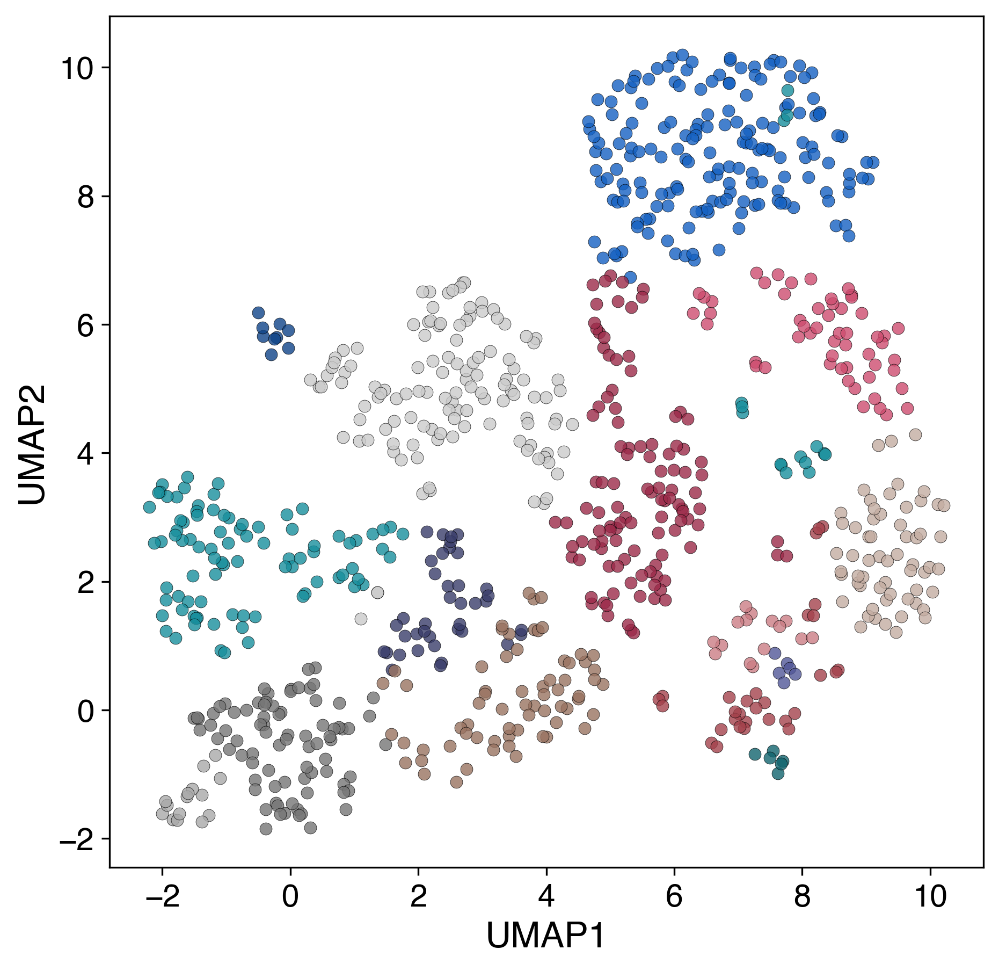

Please note that some colors only differ in the shade.


In [56]:
# draw the clusters
print("Visualization of the clusters:")

# making sure there are enough colors
all_colors = all_colors * 4

plt.figure(figsize=(7,7),dpi=300)
plt.xlabel("UMAP1",fontsize=16)
plt.ylabel("UMAP2",fontsize=16)

for cluster_id in sorted(df_umap['clusters'].unique()):
    color_id = cluster_id-1  # colors are zero-index, but clusters one-indexed
    cluster_data = df_umap[df_umap['clusters'] == cluster_id]
    plt.scatter(
        cluster_data['UMAP1'], cluster_data['UMAP2'],
        color=all_colors[color_id],
        label=f'Cluster {cluster_id}',
        s=30, alpha=0.8, edgecolor='k', linewidth=0.2
    )
plt.show()
print("Please note that some colors only differ in the shade.")

In [57]:
# function to calculate the scope score
def calculate_scope_score(av_yield,Vendi_score,bounds):
    scaled_yield = (av_yield - bounds["yield"][1])/(bounds["yield"][0] - bounds["yield"][1])
    scaled_Vendi = (Vendi_score - bounds["vendi"][1])/(bounds["vendi"][0] - bounds["vendi"][1])

    return scaled_yield * scaled_Vendi

In [58]:
# calculate the center-most point of each cluster and the Vendi score for the resulting samples
scope_results = pd.DataFrame(np.nan,index=["Results"],columns=["Average yield (%)","Vendi score","Scope score"])

cluster_yields = [] # list to save the yields
df_vendi = df_labelled.copy(deep=True)
df_vendi["yield"] = "PENDING"  # reset the yield data so that only the selected points will have a yield
for cluster in range(max(df_data["clusters"].unique())):  # loop through all clusters
    cluster = cluster+1  # +1 because the range object is 0-indexed whereas the cluster are 1-indexed
    df_cluster = df_data.loc[df_data["clusters"]== cluster]  # look at the points in the current cluster
    df_cluster = df_cluster.drop(columns=["clusters"])  # drop the cluster column to only keep the features (df_data did not contain the yield data)
    centroid = df_cluster.mean().values  # this is the center of the cluster
    distances = cdist(df_cluster,[centroid],metric="cityblock").flatten()  # calculate the distances to the center
    df_cluster["distances"] = distances
    centermost_point = df_cluster[df_cluster["distances"] == df_cluster["distances"].min()].index[0]  # get the center-most point
    yield_clusterpoint = df_labelled.at[centermost_point,"yield"]  # get the yield data for the center-most point
    df_vendi.loc[centermost_point,"yield"] = "1"  # put a label for the vendi score calculation (value is not important)
    cluster_yields.append(yield_clusterpoint)  # save the point
av_yield = sum(cluster_yields)/len(cluster_yields)
scope_results.loc["Results","Average yield (%)"] = av_yield
df_vendi.to_csv(wdir.joinpath("df_data_vendi.csv"),index=True,header=True)  # save the file (as the Vendi score calculation needs a file as input)
Vendi_score = ScopeBO().get_vendi_score(objectives=["yield"],directory=".",filename="df_data_vendi.csv")  # calculate the vendi score
scope_results.loc["Results","Vendi score"] = Vendi_score
scope_score = calculate_scope_score(av_yield,Vendi_score,bounds)
scope_results.loc["Results","Scope score"] = scope_score

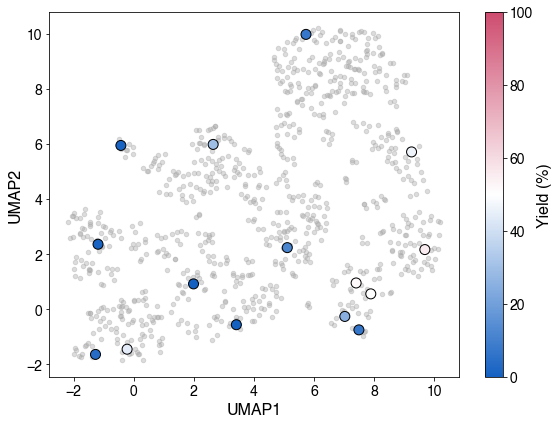

Scope results:


,Average yield (%),Vendi score,Scope score
Results,22.213333,2.6191,-0.000026


In [59]:
plt.figure(figsize=(8,6))
plt.xlabel("UMAP1",fontsize=16)
plt.ylabel("UMAP2",fontsize=16)

# only keep the objective label for evaluated points
df_umap["yield"] = df_labelled["yield"]

for idx in df_vendi.index:
    if df_vendi.loc[idx,"yield"] == "PENDING":
        df_umap.loc[idx,"yield"] = "PENDING"

# Separate numeric and non-numeric (e.g., "PENDING") entries
df_numeric = df_umap[pd.to_numeric(df_umap['yield'], errors='coerce').notna()].copy()
df_numeric['yield'] = df_numeric['yield'].astype(float)
df_pending = df_umap[pd.to_numeric(df_umap['yield'], errors='coerce').isna()]

# Define colormap and normalization
vmin = df_labelled['yield'].min()
vmax = df_labelled['yield'].max()
norm = plt.Normalize(vmin, vmax)
cmap = sns.color_palette("Doyle_cont", as_cmap=True)

# Plot non-numeric entries ("PENDING")
plt.scatter(df_pending["UMAP1"], df_pending["UMAP2"], color=all_colors[6], s=20, alpha=0.4, label="PENDING")
# Plot numeric entries
scatter_numeric = plt.scatter(df_numeric["UMAP1"],df_numeric["UMAP2"],c=df_numeric["yield"],cmap=cmap,norm=norm,s=100,alpha=1,edgecolor='k',linewidth=1)
# Add colorbar
cbar = plt.colorbar(scatter_numeric)
cbar.set_label("Yield (%)")

plt.tight_layout()
plt.show()
print("Scope results:")
scope_results

In [60]:
bounds

{'yield': (49.996187500000005, 20.799500000000002),
 'vendi': (8.327147197351627, 2.6221917983934344)}

Both metrics are low. The Vendi score is almost exactly the lower bounds for this metric, resulting in a scope score of 0.

In [61]:
# function to show the molecular structure of the selected compounds
def generate_representation(smiles_list,common_core="C(=O)O"):
    # Convert to molecules
    mol_list = [Chem.MolFromSmiles(smiles) for smiles in smiles_list]

    # Generate 2D coordinates for all mols
    for mol in mol_list:
        AllChem.Compute2DCoords(mol)

    # Define common core substructure for alignment
    core = Chem.MolFromSmarts(common_core)
    AllChem.Compute2DCoords(core)

    # Align each molecule to the substructure if it matches
    for mol in mol_list:
        if mol.HasSubstructMatch(core):
            AllChem.GenerateDepictionMatching2DStructure(mol, core)

    return mol_list

Selected scope:


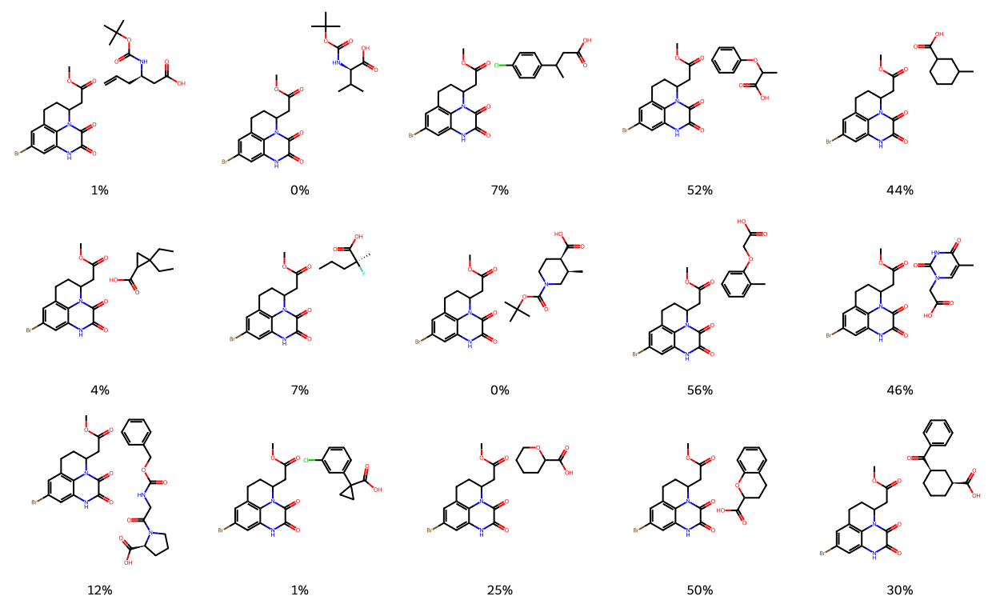

In [62]:
print("Selected scope:")
df_selected = df_umap.loc[df_umap["yield"] != "PENDING"]
mol_list = generate_representation(list(df_selected.loc[df_selected["yield"] != "PENDING"].index))
depiction = Draw.MolsToGridImage(
    mol_list,
    molsPerRow=5,
    subImgSize=(250, 250),
    legends=[f"{round(df_selected.loc[smiles,'yield'])}%" for smiles in df_selected.index]
    )
display(depiction)

Redo the scope selection with a fixed scope size of 27 samples (same as ScopeBO)

In [63]:
print("Best representation and silhouette score for a scope size of 27:"\
      f" {silh_scores.loc[27].idxmax()}; {silh_scores.loc[27].max()}")
embedding = silh_scores.loc[27].idxmax()
nr_clusters = 27
# Clustering
z = hierarchy.linkage(dfs[embedding],method ="ward",metric="euclidean")
clusters = hierarchy.fcluster(z,nr_clusters,criterion="maxclust")

# Assign to samples
df_data["clusters"] = clusters
df_umap["clusters"] = clusters

Best representation and silhouette score for a scope size of 27: umap40; 0.7054377198219299


Visualization of the clusters:


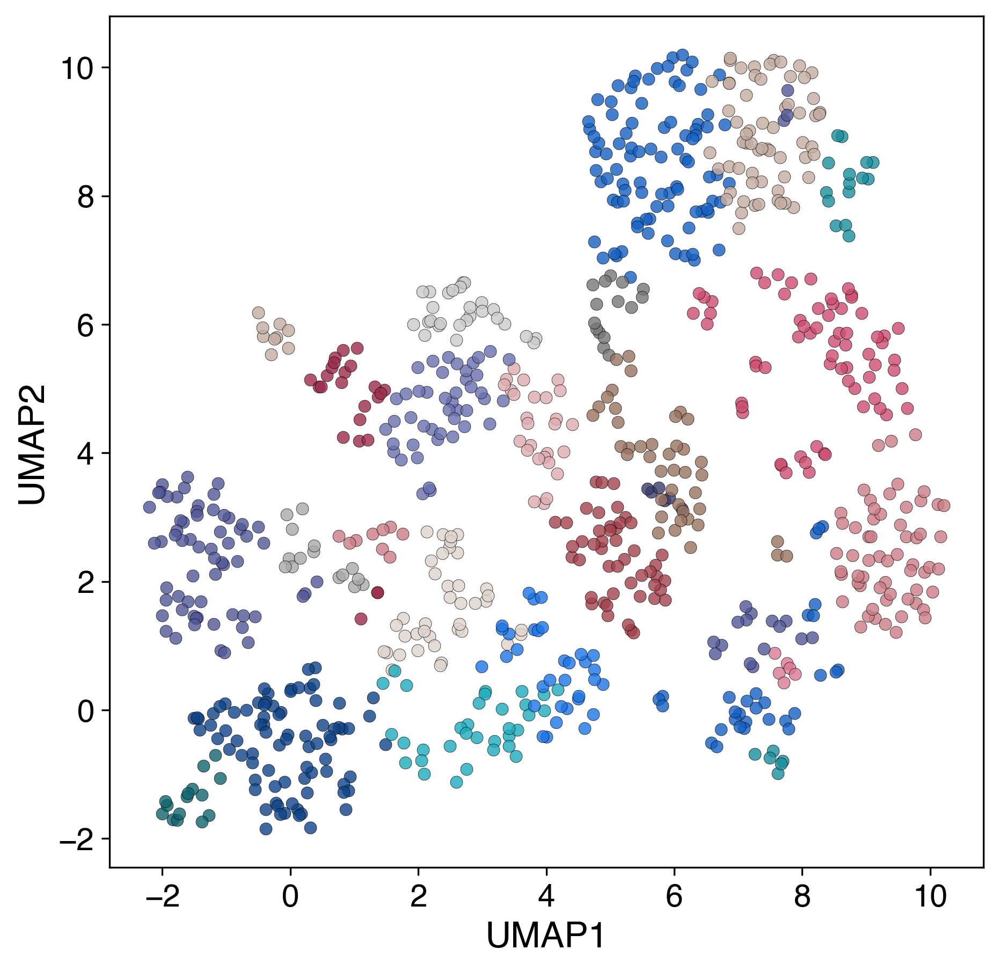

Please note that some colors only differ in the shade and some colors are also repeated to the large number of clusters.


In [64]:
# draw the clusters
print("Visualization of the clusters:")

# making sure there are enough colors
all_colors = all_colors * 4

plt.figure(figsize=(7,7),dpi=300)
plt.xlabel("UMAP1",fontsize=16)
plt.ylabel("UMAP2",fontsize=16)

for cluster_id in sorted(df_umap['clusters'].unique()):
    color_id = cluster_id-1  # colors are zero-index, but clusters one-indexed
    cluster_data = df_umap[df_umap['clusters'] == cluster_id]
    plt.scatter(
        cluster_data['UMAP1'], cluster_data['UMAP2'],
        color=all_colors[color_id],
        label=f'Cluster {cluster_id}',
        s=30, alpha=0.8, edgecolor='k', linewidth=0.2
    )
plt.show()
print("Please note that some colors only differ in the shade and"\
      " some colors are also repeated to the large number of clusters.")

In [65]:
# calculate the center-most point of each cluster and the Vendi score for the resulting samples
scope_results27 = pd.DataFrame(np.nan,index=["Results"],columns=["Average yield (%)","Vendi score","Scope score"])

cluster_yields = [] # list to save the yields
df_vendi = df_labelled.copy(deep=True)
df_vendi["yield"] = "PENDING"  # reset the yield data so that only the selected points will have a yield
for cluster in range(max(df_data["clusters"].unique())):  # loop through all clusters
    cluster = cluster+1  # +1 because the range object is 0-indexed whereas the cluster are 1-indexed
    df_cluster = df_data.loc[df_data["clusters"]== cluster]  # look at the points in the current cluster
    df_cluster = df_cluster.drop(columns=["clusters"])  # drop the cluster column to only keep the features (df_data did not contain the yield data)
    centroid = df_cluster.mean().values  # this is the center of the cluster
    distances = cdist(df_cluster,[centroid],metric="cityblock").flatten()  # calculate the distances to the center
    df_cluster["distances"] = distances
    centermost_point = df_cluster[df_cluster["distances"] == df_cluster["distances"].min()].index[0]  # get the center-most point
    yield_clusterpoint = df_labelled.at[centermost_point,"yield"]  # get the yield data for the center-most point
    df_vendi.loc[centermost_point,"yield"] = "1"  # put a label for the vendi score calculation (value is not important)
    cluster_yields.append(yield_clusterpoint)  # save the point
av_yield = sum(cluster_yields)/len(cluster_yields)
scope_results27.loc["Results","Average yield (%)"] = av_yield
df_vendi.to_csv(wdir.joinpath("df_data_vendi.csv"),index=True,header=True)  # save the file (as the Vendi score calculation needs a file as input)
Vendi_score = ScopeBO().get_vendi_score(objectives=["yield"],directory=".",filename="df_data_vendi.csv")  # calculate the vendi score
scope_results27.loc["Results","Vendi score"] = Vendi_score
scope_score = calculate_scope_score(av_yield,Vendi_score,bounds)
scope_results27.loc["Results","Scope score"] = scope_score

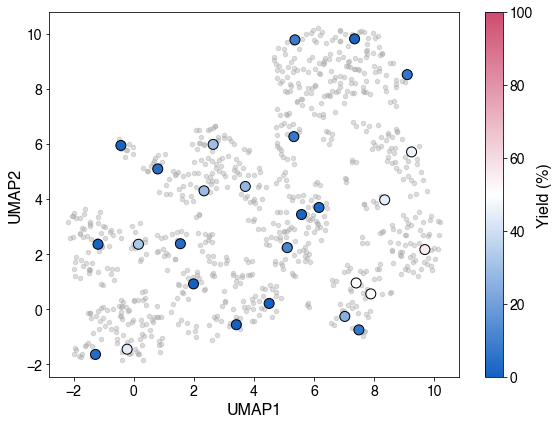

Scope results:


,Average yield (%),Vendi score,Scope score
Results,18.240741,2.77151,-0.002294


In [66]:
plt.figure(figsize=(8,6))
plt.xlabel("UMAP1",fontsize=16)
plt.ylabel("UMAP2",fontsize=16)

# only keep the objective label for evaluated points
df_umap["yield"] = df_labelled["yield"]

for idx in df_vendi.index:
    if df_vendi.loc[idx,"yield"] == "PENDING":
        df_umap.loc[idx,"yield"] = "PENDING"

# Separate numeric and non-numeric (e.g., "PENDING") entries
df_numeric = df_umap[pd.to_numeric(df_umap['yield'], errors='coerce').notna()].copy()
df_numeric['yield'] = df_numeric['yield'].astype(float)
df_pending = df_umap[pd.to_numeric(df_umap['yield'], errors='coerce').isna()]

# Define colormap and normalization
vmin = df_labelled['yield'].min()
vmax = df_labelled['yield'].max()
norm = plt.Normalize(vmin, vmax)
cmap = sns.color_palette("Doyle_cont", as_cmap=True)

# Plot non-numeric entries ("PENDING")
plt.scatter(df_pending["UMAP1"], df_pending["UMAP2"], color=all_colors[6], s=20, alpha=0.4, label="PENDING")
# Plot numeric entries
scatter_numeric = plt.scatter(df_numeric["UMAP1"],df_numeric["UMAP2"],c=df_numeric["yield"],cmap=cmap,norm=norm,s=100,alpha=1,edgecolor='k',linewidth=1)
# Add colorbar
cbar = plt.colorbar(scatter_numeric)
cbar.set_label("Yield (%)")

plt.tight_layout()
plt.show()
print("Scope results:")
scope_results27

Compared to the clustering scope above (15 samples), the Vendi score is slightly higher, but remains low. The average rate decreased and therefore is again very low so that that the scope score remains negative.

Selected scope:


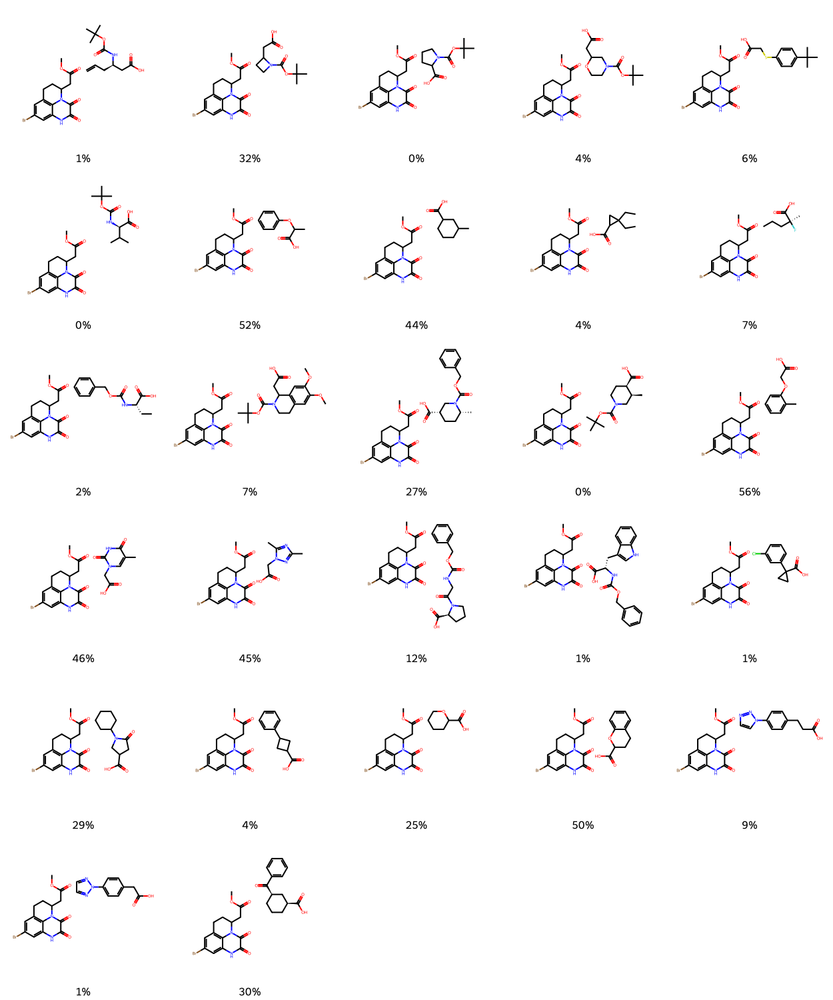

In [67]:
print("Selected scope:")
df_selected = df_umap.loc[df_umap["yield"] != "PENDING"]
mol_list = generate_representation(list(df_selected.loc[df_selected["yield"] != "PENDING"].index))
depiction = Draw.MolsToGridImage(
    mol_list,
    molsPerRow=5,
    subImgSize=(250, 250),
    legends=[f"{round(df_selected.loc[smiles,'yield'])}%" for smiles in df_selected.index]
    )
display(depiction)

### Clustering scopes using Glorius' approach

In [68]:
def assign_clusterpoints(df_clusterpoints,df_dataset):
    """Assigns the selected cluster points to the dataset by comparison of canonical smiles. Also assigns the yield labels to the cluster points dataframe."""
    # generate a new column with canonical smiles in both dataframes
    df_data = df_dataset.copy()
    for df in [df_clusterpoints,df_data]:
        smiles_labelled = list(df.index)
        mol_labelled = [Chem.MolFromSmiles(smiles) for smiles in smiles_labelled]
        can_labelled = [Chem.MolToSmiles(mol,canonical=True, isomericSmiles=False) for mol in mol_labelled]  # canonical smiles
        df["can"] = can_labelled
    
    # only keep the yield labels for datapoints in the df_clusterpoints
    df_data.loc[~df_data["can"].isin(set(df_clusterpoints["can"])),"yield"] = 'PENDING'

    # assign the yield labels to df_clusterpoints
    for smiles in df_clusterpoints["can"]:
        df_clusterpoints.loc[df_clusterpoints["can"]==smiles,"yield"] = df_data.loc[df_data["can"]==smiles,"yield"].values[0]

    df_data.drop(axis=1,labels="can",inplace=True)
    df_clusterpoints.drop(axis=1,labels="can",inplace=True)

    return df_clusterpoints, df_data


In [69]:
def umap_representation(data_clust,ax,dict_class = None):
    """Creates a plt axes object with the selected samples visualized on a UMAP."""
    
    df_umap = pd.read_csv(f"./../XEC_data/Datasets/xec_dft_umap_acid_scope.csv",index_col=0,header=0)

    # replace the substrate smiles with the product ones
    prod_index = [conv.loc[conv["Combi"] == smiles, "Prod_Smiles"].values[0] for smiles in df_umap.index]
    df_umap.index = prod_index

    # assign the yields
    df_umap["yield"] = df_labelled["yield"]

    # Define colormap and normalization
    vmin = df_umap['yield'].min()
    vmax = df_umap['yield'].max()
    norm = plt.Normalize(vmin, vmax)
    cmap = sns.color_palette("Doyle_cont", as_cmap=True)

    full_scope = data_clust.index.to_list()
    if dict_class is not None:
        full_scope += list(dict_class.keys())

    # assign scope samples
    df_umap["status"] = "none"
    if dict_class is not None:
        df_umap.loc[df_umap.index.isin(set(dict_class.keys())), "status"] = "classical"
    df_umap.loc[df_umap.index.isin(data_clust[data_clust["yield"] != "PENDING"].index), "status"] = "clustering"

    # remove yields for non-selected compounds
    df_umap.loc[df_umap["status"] == "none", "yield"] = "PENDING"

    # Plot the non-selected samples
    df_map_pending = df_umap.loc[df_umap["status"] == "none"].copy()
    ax.scatter(df_map_pending["UMAP1"], df_map_pending["UMAP2"], color=all_colors[6], s=20, alpha=0.4, label="not selected")

    # Plot entries of the clustering scope
    df_map_clust = df_umap.loc[df_umap["status"] == "clustering"].copy()

    scatter_cluster = ax.scatter(df_map_clust["UMAP1"],df_map_clust["UMAP2"], label="clustering",
                                 c=df_map_clust["yield"],cmap=cmap,norm=norm, marker="o",
                                 s=100,alpha=1,edgecolor='k',linewidth=1)
    
    # Plot entries of the classical scope (if is exists)
    if dict_class is not None:
        df_map_class = df_umap.loc[df_umap["status"] == "classical"].copy()
        ax.scatter(df_map_class["UMAP1"],df_map_class["UMAP2"], label = "classical",
                                    c=df_map_class["yield"],cmap=cmap,norm=norm,marker="s",
                                    s=100,alpha=1,edgecolor='k',linewidth=1)

    # Add colorbar
    cbar = fig.colorbar(scatter_cluster,ax=ax)
    cbar.set_label("Yield (%)")

    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")

The scope was created using the webapp https://pharmascope.uni-muenster.de/ using the recommended settings (15 clusters to generate 15 compounds and using the provided standard UMAP 0_ECFP_2_512_UMAP_2dim_30nb_0.1mindist_jaccard.model).

In [70]:
# the clustering algorithm by Glorius and co-workers takes SMILES strings as the input.
# As the algorithm is not compatible with smiles of substrate combinations, we used the product smiles instead

# Load the smiles list
conv = pd.read_csv(f"./../XEC_data/xec_raw_dset_acid_scope.csv",index_col=0)
smiles_list = conv["Prod_Smiles"].to_list()
# create the input smiles list for the webapp
pd.DataFrame(smiles_list,index=None,columns=None).to_csv(f"./Results_Data/cluster_scope/xec_acid_scope_smiles_list.txt",
                                                         index=False,header=False)

A list of the product SMILES strings of all decarboxylative coupling products was provided as the input and the top-1 substrate per cluster was requested. After running the prediction in the webapp, the results can be read in.

Products selected by the clustering algorithm:


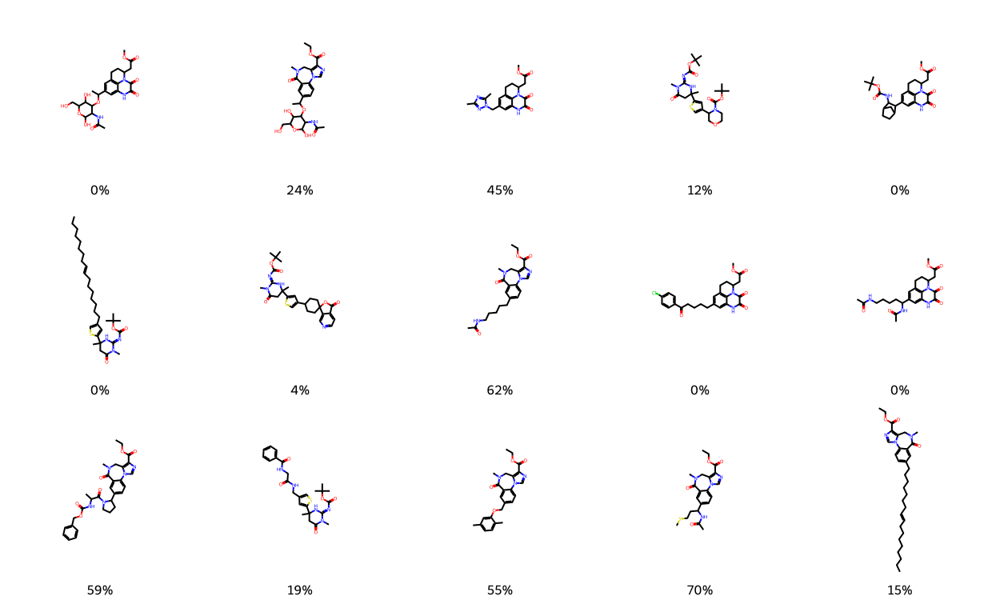

Number of selected compounds: 15


In [71]:
scope_results_15clu = pd.DataFrame(np.nan,index=["Results"],columns=["Scope size",
                                                                     "Average yield (%)",
                                                                     "Vendi score","Scope score"])
df_clustering = pd.read_csv(f"./Results_Data/cluster_scope/glorius_selected_samples.csv",
                                    index_col=0,header=0)
df_clustering.set_index("smiles",inplace=True)

# replace the index in the labelled dataframe with the product smiles
conv["Combi"] = conv["ArX_Smiles"] + "." + conv["Acid_Smiles"]
new_index = [conv.loc[conv["Combi"] == smiles,"Prod_Smiles"].values[0] for smiles in df_labelled.index]
df_labelled.index = new_index

df_clustering, df_data = assign_clusterpoints(df_clusterpoints=df_clustering,
                                                            df_dataset=df_labelled)

mol_list = generate_representation(list(df_clustering.index))
depiction = Draw.MolsToGridImage(
    mol_list,
    molsPerRow=5,
    subImgSize=(250, 250),
    legends=[f"{round(df_clustering.loc[smiles,'yield'])}%" for smiles in df_clustering.index]
    )
print(f"Products selected by the clustering algorithm:")
display(depiction)

print(f'Number of selected compounds: {len(df_clustering)}')
scope_results_15clu.loc["Results","Scope size"] = len(df_clustering)

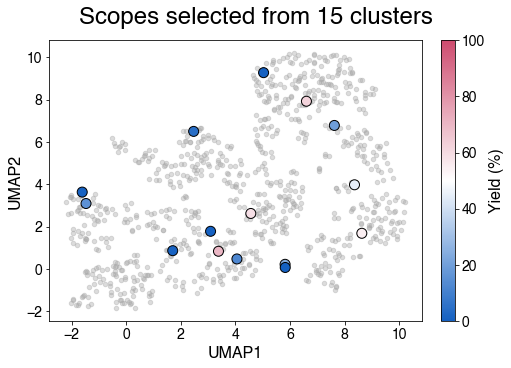

,Scope size,Average yield (%),Vendi score,Scope score
Results,15.0,24.506667,4.203,0.035


In [72]:
fig,axes = plt.subplots(figsize=(7,5),constrained_layout=True)
fig.suptitle("Scopes selected from 15 clusters")
av_yield = df_clustering["yield"].mean()
scope_results_15clu.loc["Results","Average yield (%)"] = av_yield
df_data.to_csv("df_vendi.csv",index=True,header=True)
vendi_score = ScopeBO().get_vendi_score(objectives=["yield"],filename="df_vendi.csv")
scope_results_15clu.loc["Results","Vendi score"] = round(vendi_score,3)
scope_score = calculate_scope_score(av_yield,vendi_score,bounds)
scope_results_15clu.loc["Results","Scope score"] = round(scope_score,3)
umap_representation(df_data,axes)
plt.show()
scope_results_15clu

The average yield is low and the Vendi score is mediocre, resulting in a low scope score.

Do a "short classical scope" (here simulated as 20 samples selected with greedy acquisition with 5% Vendi pruning) in combination with a clustering scope of 15 samples. This combination was recommended by Glorius and co-workers

In [73]:
# Benchmark().collect_data(
#     filename_labelled = "./../XEC_data/Datasets/xec_dft_data_acid_scope.csv",
#     name_results = f"./Results_Data/cluster_scope/glorius_class_scope",
#     objectives=['yield'],
#     budget = 20,
#     batches= [2],
#     Vendi_pruning_fractions = [5],
#     seeds = 40,
#     acquisition_function_mode= "greedy",
#     pruning_metric="vendi_batch",
#     init_sampling_method="random"
#     )

Find the random initiation that gives an average scope performance.

In [74]:
# find the scope that gives an average scope score
initiation = "random_initiation"
classical_scope = pd.DataFrame(np.nan,index=["Results"],columns = ["Seed", "Seed average yield (%)", "Seed Vendi score",
                                                                "Seed scope score","Average scope score"])

# get the data for the inidividual seeds
_, dict_dfs_raw_data = Benchmark.get_metric_overview(bounds=bounds,budget=20,type_results="scope", 
                            name_results=f"./Results_Data/cluster_scope/glorius_class_scope")

# dict_dfs_raw_data contains the a dict for each batch-pruning 
# combination which in turn contains a dict of the raw data for the differnt random seeds
# --> restrict to the relevant data (batch size 2 and no Vendi pruning)
dfs_raw_data = dict_dfs_raw_data["b2_V5"]

# collect the scope scores and other metrics
# NOTE: the indices are the (zero-indexed) rounds --> round 9 is the full scope of 20 samples
score_dict = {seed: df.loc[9,"scope"] for seed,df in dfs_raw_data.items()}
yield_dict = {seed: df.loc[9,"yield"] for seed,df in dfs_raw_data.items()}
vendi_dict = {seed: df.loc[9,"vendi"] for seed,df in dfs_raw_data.items()}
av_score = np.mean(np.array(list(score_dict.values())))
classical_scope.loc["Results","Average scope score"] = av_score

# calculate the absolute difference to the average score
score_diff = {seed: abs(score-av_score) for seed,score in score_dict.items()}

# get the seed that is closest to the average
av_seed = min(score_diff,key=score_diff.get)
classical_scope.loc["Results","Seed"] = av_seed
classical_scope.loc["Results","Seed scope score"] = score_dict[av_seed]
classical_scope.loc["Results","Seed Vendi score"] = vendi_dict[av_seed]
classical_scope.loc["Results","Seed average yield (%)"] = yield_dict[av_seed]
classical_scope

,Seed,Seed average yield (%),Seed Vendi score,Seed scope score,Average scope score
Results,19.0,34.095,3.927392,0.104183,0.107344


The yield of the selected samples in the classical scope is very high, but the Vendi score is low, resulting in a fairly low scope score.

In [75]:
# remove the samples that were selected in the classical scope from the options presented to the clustering algorithm

# get the scope
seed = int(classical_scope.loc["Results","Seed"])
df_classical = pd.read_csv(f"./Results_Data/cluster_scope/glorius_class_scope/"\
                            f"raw_data/20greedy_b2_V5_s{seed}.csv", index_col=0, header=0)
df_classical["eval_samples"] = df_classical["eval_samples"].apply(lambda x: [y.strip("'") for y in x[1:-1].split(', ')])

# record the selected smiles and convert from substrate to product smiles
smiles_list = [smiles for round_list in [df_classical.loc[round,"eval_samples"] 
                                            for round in df_classical.index] for smiles in round_list]
smiles_list = [smiles.encode().decode('unicode_escape') for smiles in smiles_list]
smiles_list = [conv.loc[conv["Combi"] == smiles, "Prod_Smiles"].values[0] for smiles in smiles_list]

# load the full smiles list for the dataset
full_smiles_list = df_labelled.index.to_list()
# record the smiles, yields for the classical scope
classical_smiles = {smiles: df_labelled.loc[smiles,"yield"] for smiles in smiles_list}

# remove the compounds that were already selected
for smiles in smiles_list:
    full_smiles_list.remove(smiles)
pd.DataFrame(full_smiles_list,index=None,columns=None).to_csv(f"./Results_Data/cluster_scope/"\
                                                                f"glorius_class_smiles_list.txt",
                                                                index=False, header=False)

Products selected as the classical scope:


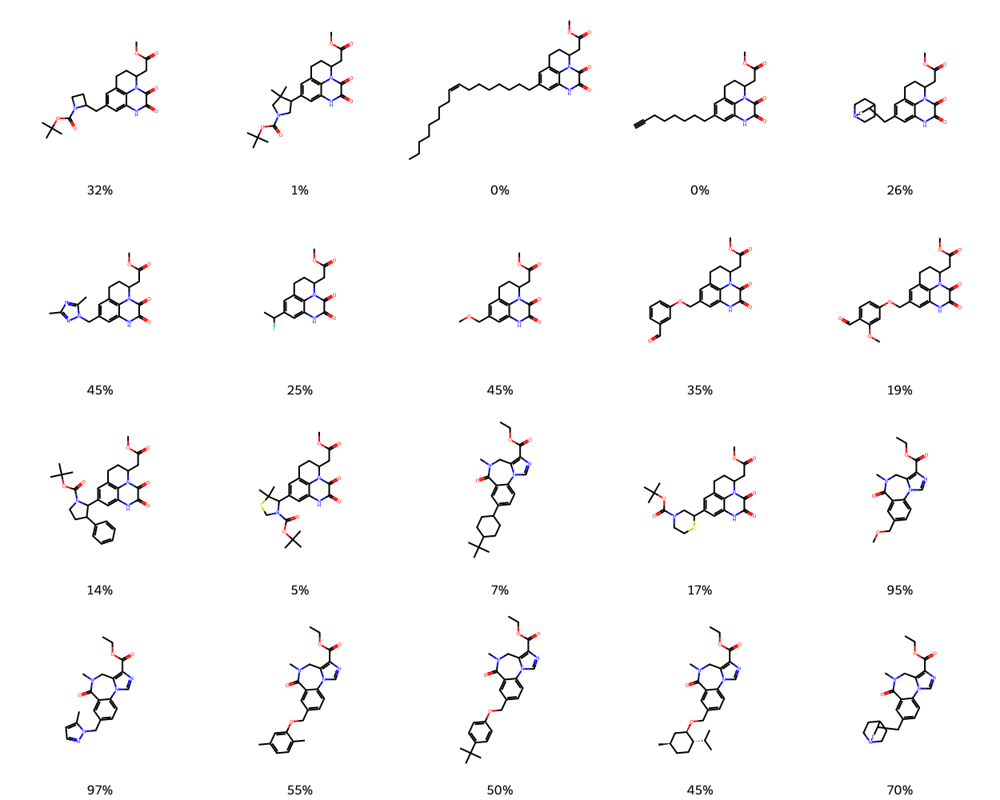

Products selected by the subsequent clustering algorithm:


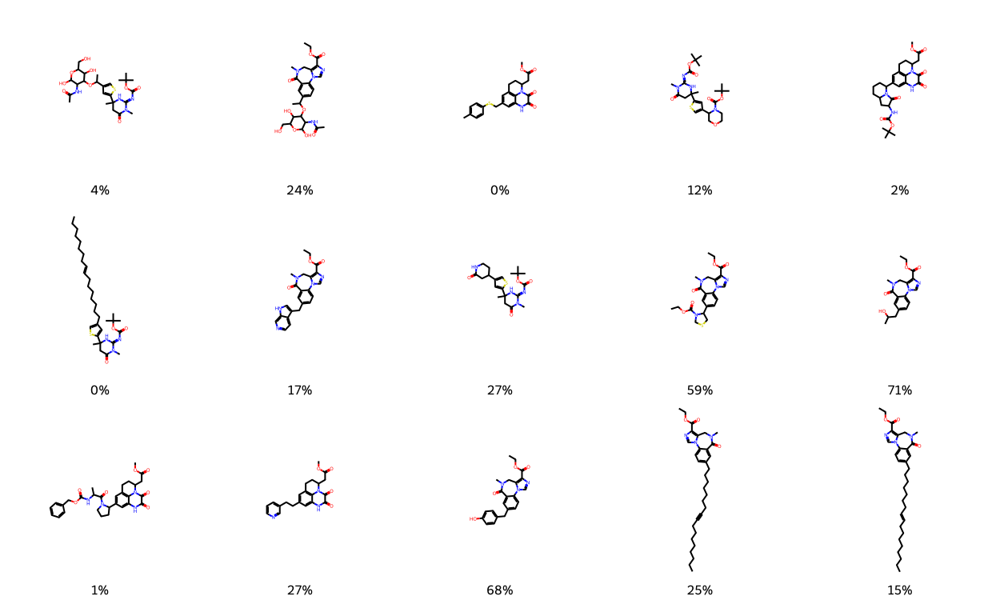

In [76]:
df_clustering = pd.read_csv(f"./Results_Data/cluster_scope/"\
                            f"glorius_selected_samples_comb.csv",index_col=0,header=0)
df_clustering.set_index("smiles",inplace=True)

df_clustering, df_data_clust = assign_clusterpoints(df_clusterpoints=df_clustering,df_dataset=df_labelled)

for results_type in ["class","clust"]:
    if results_type == "class":
        mol_list = generate_representation(list(classical_smiles.keys()))
        print(f"Products selected as the classical scope:")
        legends = [f"{round(val)}%" for val in classical_smiles.values()]
    elif results_type == "clust":
        mol_list = generate_representation(list(df_clustering.index))
        print(f"Products selected by the subsequent clustering algorithm:")
        legends = [f"{round(df_clustering.loc[smiles,'yield'])}%" for smiles in df_clustering.index]
    depiction = Draw.MolsToGridImage(
        mol_list,
        molsPerRow=5,
        subImgSize=(250, 250),
        legends=legends
        )
    display(depiction)

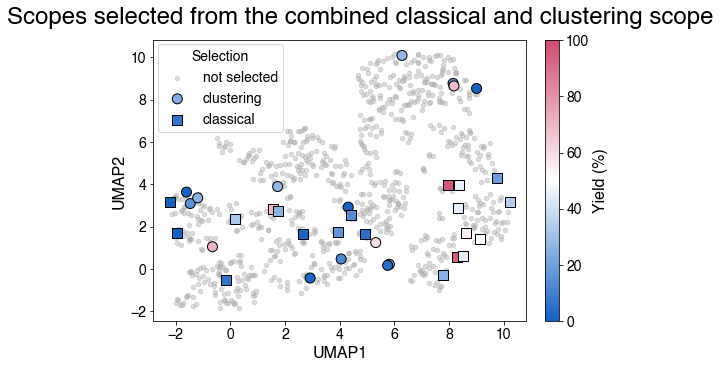

Results for the combined scope of first 20-sample classical scope and then a 15-sample clustering scope:


,Average yield (%),Vendi score,Scope score (combined scope)
Results,29.6,4.704,0.11


In [77]:
# df to record results
scope_results_class = pd.DataFrame(np.nan,index=["Results"],columns=["Average yield (%)", "Vendi score",
                                                                  "Scope score (combined scope)"])

fig,axes = plt.subplots(figsize=(7,5),constrained_layout=True)
fig.suptitle("Scopes selected from the combined classical and clustering scope")

# combine the two scopes
data_full = df_data_clust.copy()
for idx in data_full.index:
    if idx in classical_smiles.keys():
        data_full.loc[idx,"yield"] = classical_smiles[idx]

av_yield = data_full[data_full["yield"] != "PENDING"]["yield"].mean()
scope_results_class.loc["Results","Average yield (%)"] = round(av_yield,1)
data_full.to_csv("df_vendi.csv",index=True,header=True)
vendi_score = ScopeBO().get_vendi_score(objectives=["yield"],filename="df_vendi.csv")
scope_results_class.loc["Results","Vendi score"] = round(vendi_score,3)
scope_score = calculate_scope_score(av_yield,vendi_score,bounds)
scope_results_class.loc["Results","Scope score (combined scope)"] = round(scope_score,3)
umap_representation(df_data_clust,axes,classical_smiles)
handles_collected, labels_collected = ax.get_legend_handles_labels()
plt.legend(handles=handles_collected, labels=labels_collected, title = "Selection", 
           bbox_to_anchor=(0.18, 0.83), fontsize=14, loc='center')
plt.show()
print("Results for the combined scope of first 20-sample classical scope and then a 15-sample clustering scope:")
scope_results_class

The combined classical and clustering scopes have a strongly lowered average yield compared to just the classical scope, but the Vendi score increased to a mediocre score. The resulting scope score remains rather low.

### Benchmark comparisons

Collecting the data

In [78]:
acq_fct = ["EI","Random","Greedy","Conv. selection"]
pruning_opt = [False,True]
datasets = ["high","medium","low"]

map_data = {}
std_data = {}
for acq in acq_fct:
    if acq == "Conv. selection":
        acq_label =  "human-like-acq"
    elif acq == "Random":
        acq_label = "random-selection"
    else:
        acq_label = acq.lower()
    for pruning in [True,False]:
        if pruning:
            pruning_label = "_with-pruning"
        else:
            pruning_label = "_no-pruning"
        if acq == "Conv. selection":
            pruning_label = ""
        run_results = []
        std_results = []
        for type_results in ["Objective","Vendi","Scope"]:
            dfs_scaled,_ = Benchmark.get_metric_overview(budget=27,type_results=type_results,
                                            name_results=f"Results_Data/comb_scope/scope_{acq_label}{pruning_label}",
                                            scope_method="product", objective_weights=None, bounds = bounds, directory=".")
            run_results.append(dfs_scaled["means"].iloc[-1,0])  # save the last mean which is the result at the end of the scope
            std_results.append(dfs_scaled["stdev"].iloc[-1,0])  # same for the standard deviation of the result
        map_data[f"{acq}{pruning_label}"] = run_results
        std_data[f"{acq}{pruning_label}"] = std_results
map_df = pd.DataFrame.from_dict(map_data)
std_df = pd.DataFrame.from_dict(std_data)

# add clustering data
# col 0 is averaged objectives; 1 is Vendi score; 2 is scope score
map_df["Doyle_clustering"] = [scope_results.iloc[0,0],scope_results.iloc[0,1],scope_results.iloc[0,2]]
std_df["Doyle_clustering"] = [0,0,0]  # no std as only one deterministic run
# col 1 is averaged objectives; 2 is Vendi score; 3 is scope score
map_df["Glorius_clustering"] = [scope_results_15clu.iloc[0,1],scope_results_15clu.iloc[0,2],
                                scope_results_15clu.iloc[0,3]]
std_df["Glorius_clustering"] = [0,0,0]  # no std as only one deterministic run

In [79]:
new_index = ["Average yield (%)", "Vendi score", "Scope score"]
new_cols = ["ScopeBo", "EI", "Random (pruned)", "Random", "Greedy (pruned)", 
            "Greedy", "Conv. selection", "Doyle clustering", "Glorius clustering"]
map_df.index = new_index
map_df.columns = new_cols
map_df

,ScopeBo,EI,Random (pruned),Random,Greedy (pruned),Greedy,Conv. selection,Doyle clustering,Glorius clustering
Average yield (%),34.598056,40.885000,23.578519,23.825648,37.557222,45.668148,41.881667,22.213333,24.506667
Vendi score,6.150237,5.278647,4.552337,3.596788,4.808141,2.469013,3.842160,2.619100,4.203000
Scope score,0.289722,0.316091,0.031920,0.017398,0.215130,-0.024242,0.156969,-0.000026,0.035000


In [80]:
std_df.index = new_index
std_df.columns = new_cols
std_df.applymap(lambda x: round(x,3))

,ScopeBo,EI,Random (pruned),Random,Greedy (pruned),Greedy,Conv. selection,Doyle clustering,Glorius clustering
Average yield (%),3.389,5.813,3.730,6.279,5.392,9.800,8.520,0,0
Vendi score,0.366,0.474,0.289,0.243,0.432,0.386,0.385,0,0
Scope score,0.067,0.095,0.042,0.039,0.067,0.058,0.082,0,0


In [81]:
full_av_yield = df_labelled["yield"].mean()
print("Average yield for the full dataset:", full_av_yield)

Average yield for the full dataset: 23.856497175141243


In [82]:
from Code.predictor import ScopeBO
full_Vendi = ScopeBO().get_vendi_score(filename="./../XEC_data/Datasets/xec_dft_data_acid_scope.csv",
                                       objectives=["yield"])
print("Vendi score for the full dataset:", full_Vendi)

Vendi score for the full dataset: 4.96993667239046


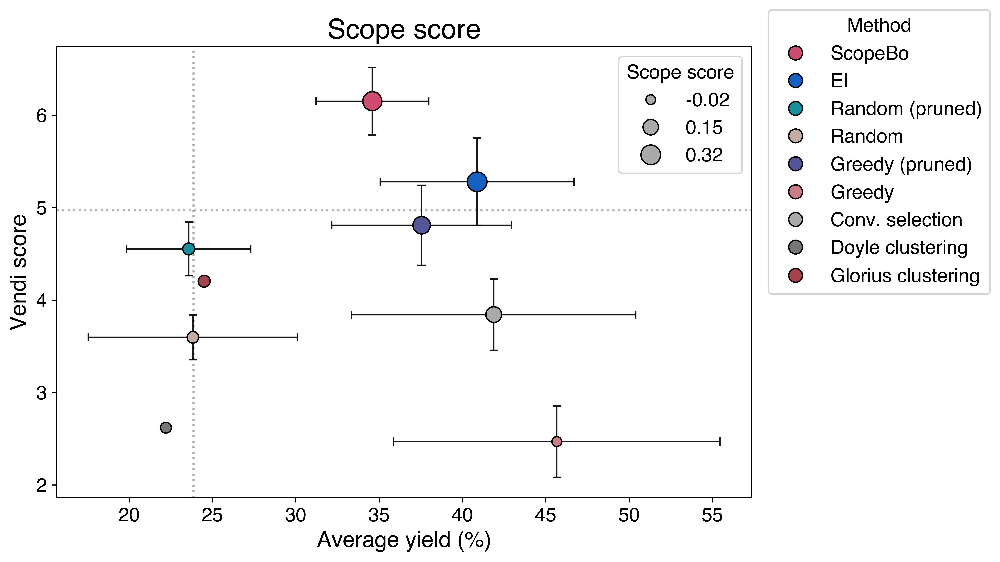

,Average yield (%),Vendi score,Scope score
ScopeBo,34.598,6.150,0.290
EI,40.885,5.279,0.316
Random (pruned),23.579,4.552,0.032
Random,23.826,3.597,0.017
Greedy (pruned),37.557,4.808,0.215
Greedy,45.668,2.469,-0.024
Conv. selection,41.882,3.842,0.157
Doyle clustering,22.213,2.619,-0.000
Glorius clustering,24.507,4.203,0.035


In [84]:
# Plot the results
x = map_df.iloc[0]
y = map_df.iloc[1]
xerr = std_df.iloc[0]
yerr = std_df.iloc[1]
raw_size_data = map_df.iloc[2]

size_min, size_max = 50, 200
data_min, data_max= raw_size_data.min(), raw_size_data.max()
sizes = size_min + (raw_size_data - data_min) * (size_max - size_min) / (data_max - data_min)

# simplify the labels for the legend
labels = map_df.columns
labels = list(labels)
for i,val in enumerate(labels):
    if val == "EI_pruning":
        labels[i] = "ScopeBO"
    elif "no-pruning" in val:
        labels[i] = val.split("_")[0]
    elif "_pruning" in val:
        labels[i] = val.split("_")[0] + " (pruned)"
map_df.columns = labels


color_map = {label: all_colors[i] for i, label in enumerate(labels)}
colors = [color_map[label] for label in labels]
alpha_val = 1

plt.figure(figsize=(9,6),dpi=600)
plt.title(f"Performance map")
plt.scatter(x, y, s=sizes, alpha=alpha_val, c = colors, edgecolors="k", zorder = 2)

# add lines for the results for the full dataset
# Vertical line for the dataset average
plt.axvline(x=full_av_yield, color=all_colors[6], linestyle=':', linewidth=1.5, zorder=0)
# Horizontal line for the Vendi score of the full dataset
plt.axhline(y=full_Vendi, color=all_colors[6], linestyle=':', linewidth=1.5, zorder=0)

# Add error bars
plt.errorbar(
    x, y,
    xerr=xerr,
    yerr=yerr,
    fmt='none',
    ecolor='black',
    elinewidth=1,
    capsize=3,
    alpha=0.9,
    zorder=1
)


plt.xlabel('Average yield (%)')
plt.ylabel('Vendi score')
plt.title('Scope score')

# legend for the methods
color_legend = [
    Line2D(
        [0], [0],
        marker='o',
        color='w',
        label=label,
        markerfacecolor=color_map[label],
        alpha=alpha_val,
        markeredgecolor='k',
        markersize=10
    )
    for label in labels
]

# legend for scope score
# Choose representative raw size values
size_legend_values = np.linspace(raw_size_data.min(), raw_size_data.max(), 3)
size_legend_sizes = size_min + (size_legend_values - data_min) * (size_max - size_min) / (data_max - data_min)
size_legend = [
    Line2D(
        [0], [0],
        marker='o',
        color='w',
        label=f'{val:.2f}',
        markerfacecolor=all_colors[6],
        alpha=alpha_val,
        markeredgecolor='k',
        markersize=np.sqrt(s)
    )
    for val, s in zip(size_legend_values, size_legend_sizes)
]

# Add legends
first_legend = plt.legend(handles=color_legend, loc = "lower left", title="Method", frameon=True,
                          bbox_to_anchor=(1.01, 0.43))
plt.gca().add_artist(first_legend)
second_legend = plt.legend(handles=size_legend, title="Scope score", frameon=True)

plt.show()
map_df.index = ["Average yield (%)", "Vendi score", "Scope score"]
map_df.applymap(lambda x: round(x,3)).T

ScopeBO as well as regular BO and explorative selection achieve a higher Vendi score than the one obtained if the whole dataset was evaluated. This highlights that ScopeBO leads to a good representation of underpresented groups in the selected scope. Other algorithms, including clustering algorithms and conventional selection, lead to an underrepresentation of such groups. Notably, a random selection also gave a Vendi score a bit below the value for the whole dataset which indicates further highlights the amount of diversity that ScopeBO achieves in a limited number of experiments.

### Visualization of scope examples

In [84]:
def find_av_random_seed(name_results, bounds, batch_pruning, budget=27):
    """Finds the random seed that give the scope with a scope score closet to the average performance."""

    _, dict_dfs_raw_data = Benchmark.get_metric_overview(bounds=bounds,budget=budget,type_results="scope", 
                                name_results=name_results)

    # dict_dfs_raw_data contains the a dict for each batch-pruning 
    # combination which in turn contains a dict of the raw data for the differnt random seeds
    # --> restrict to the relevant data (batch size 2 and no Vendi pruning)
    dfs_raw_data = dict_dfs_raw_data[batch_pruning]

    # collect the scope scores
    # NOTE: the indices are the (zero-indexed) rounds --> round 8 is the full scope of 27 samples
    score_dict = {seed: df.loc[8,"scope"] for seed,df in dfs_raw_data.items()}
    av_score = np.mean(np.array(list(score_dict.values())))

    # calculate the absolute difference to the average score
    score_diff = {seed: abs(score-av_score) for seed,score in score_dict.items()}

    # get the seed that is closest to the average
    av_seed = min(score_diff,key=score_diff.get)

    return av_seed


def get_umap(name_results, hyperpar="balanced_b3_V13", bounds = bounds, seed = None,figsize=(2.7,2.7), show_colorbar=False):

    # Find the random seed that gives the most average performance if none is specified in the input
    if seed is None:
        seed = find_av_random_seed(name_results= name_results, bounds=bounds, batch_pruning= "_".join(hyperpar.split("_")[1:]))
    print("Depicted seed:",seed)
    Benchmark().track_samples(filename_umap=f"./../XEC_data/Datasets/xec_dft_umap_acid_scope.csv",
                            filename_data=f"27{hyperpar}_s{seed}.csv",
                            bounds=bounds,
                            hide_axis = True, obj_plot_bounds=(100,0),
                            filename_labelled=f"./../XEC_data/Datasets/xec_dft_data_acid_scope.csv",
                            name_results= name_results+ "/raw_data", show_colorbar= show_colorbar,
                            label_round=False, display_cut_samples=False, figsize = figsize, size_scaling = 0.3, dpi=600)
    # return the seed so that it can be reused
    return seed

UMAP for ScopeBO:

Depicted seed: 32
Scope score: 0.286
Average yield: 32.989
Vendi score: 6.529


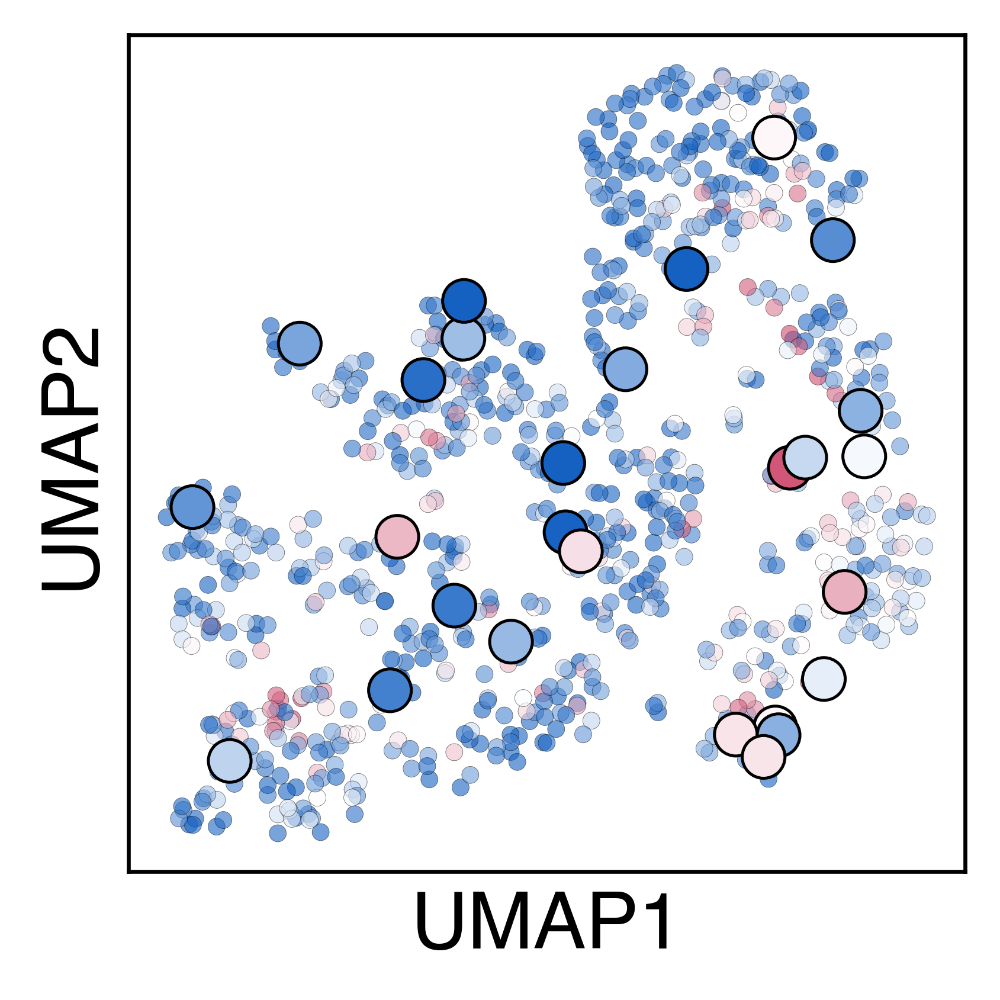

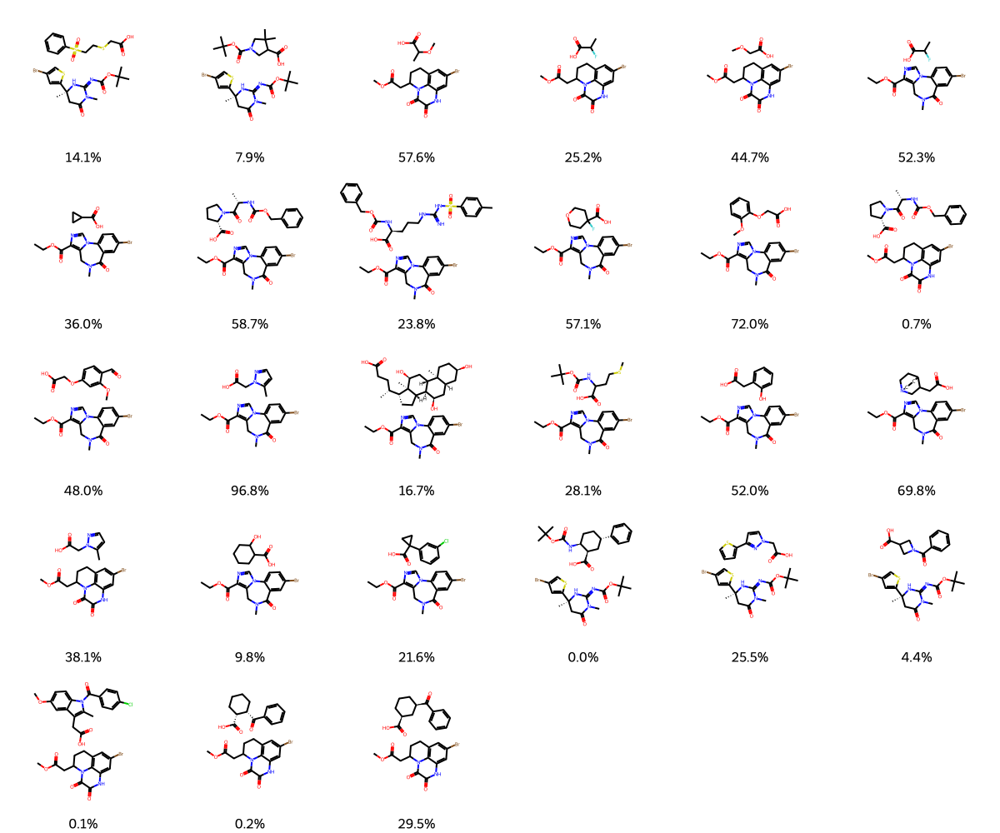

UMAP for Regular BO (EI):

Depicted seed: 32
Scope score: 0.412
Average yield: 44.400
Vendi score: 5.527


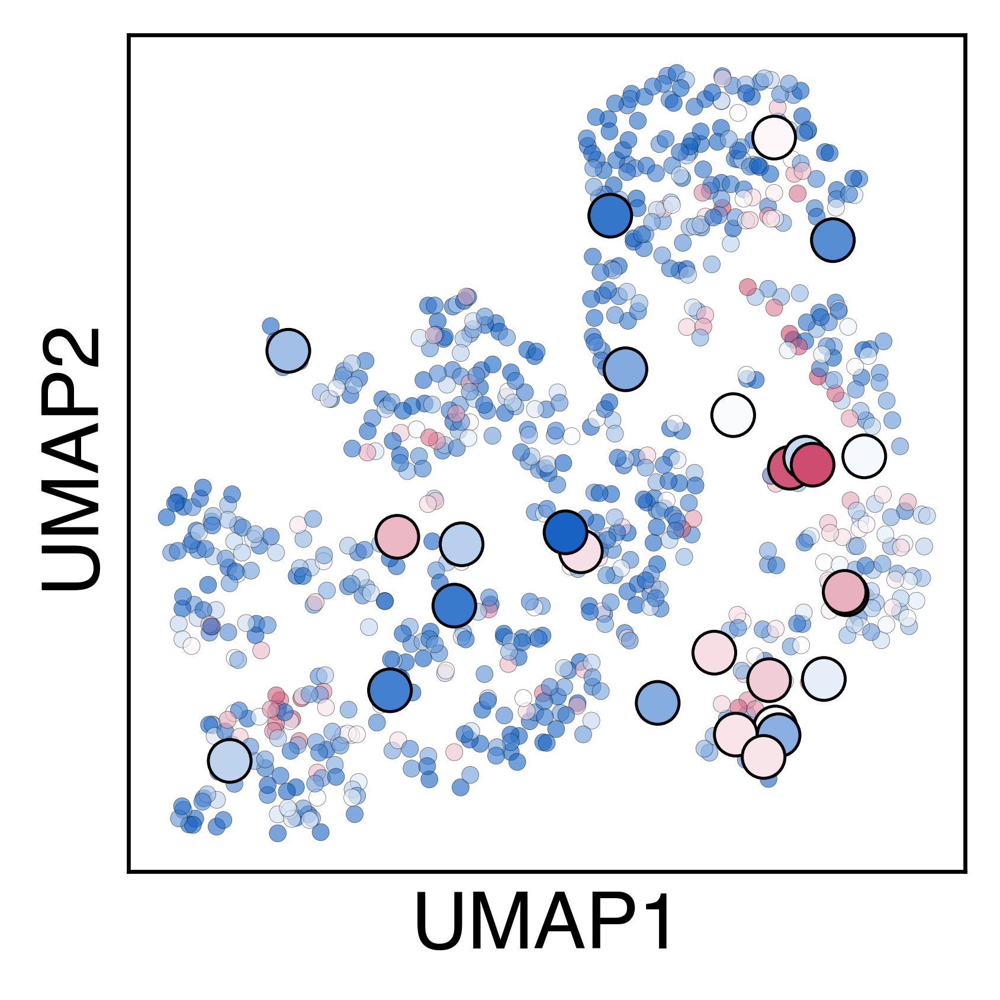

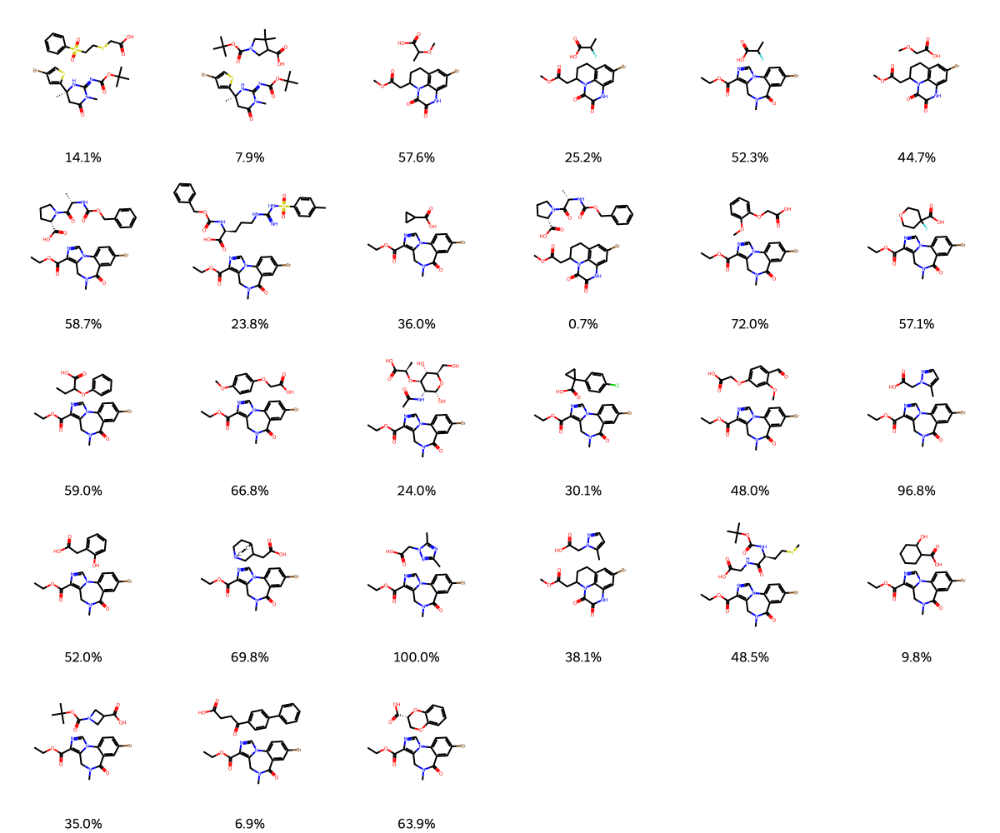

UMAP for conventional selection:

Depicted seed: 32
Scope score: 0.330
Average yield: 50.522
Vendi score: 4.471


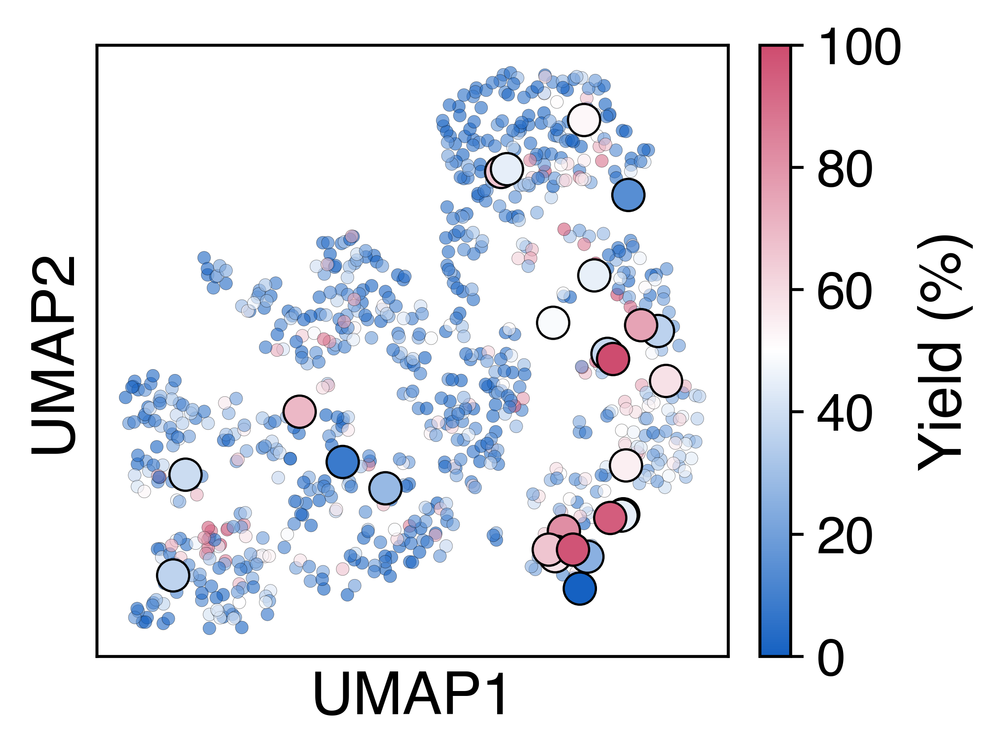

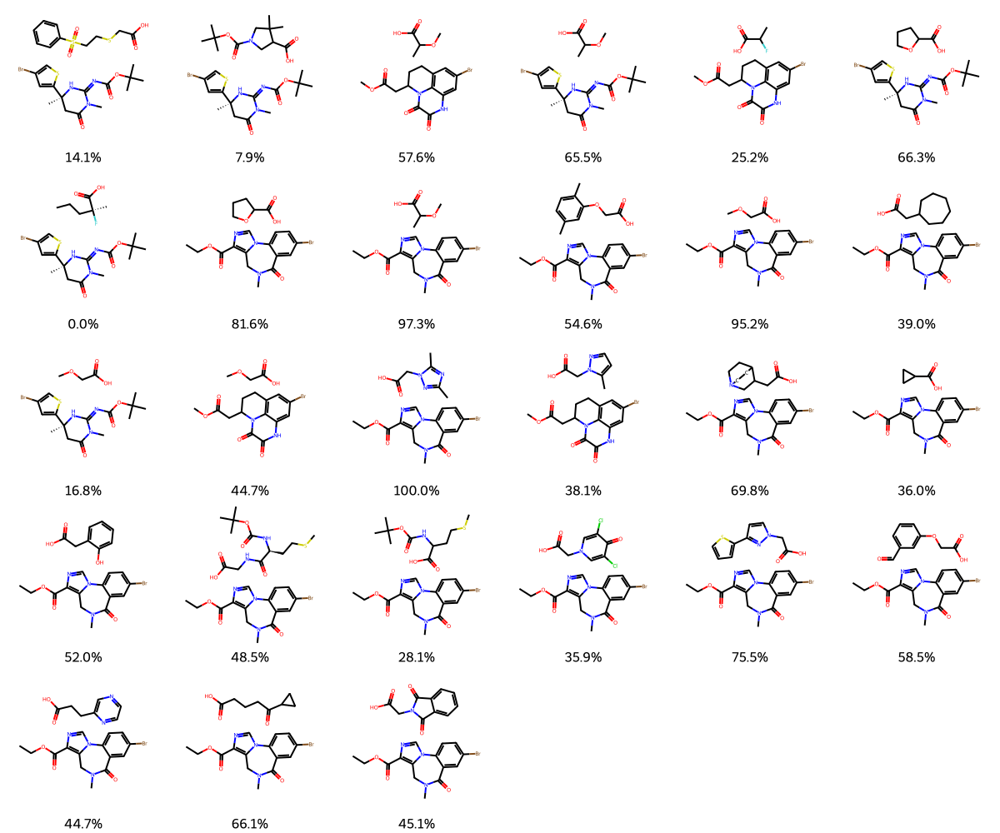

In [85]:
print(f"UMAP for ScopeBO:\n")
seed = get_umap(name_results=f"./Results_Data/comb_scope/scope_ei_with-pruning", bounds=bounds, show_colorbar = False, figsize = (2.7, 2.7))
Benchmark().show_scope(filename_data=f"27balanced_b3_V13_s{seed}.csv", name_results=f"./Results_Data/comb_scope/scope_ei_with-pruning/raw_data", by_round=False,
                        round_values=3, label_suffix="%")
print(f"UMAP for Regular BO (EI):\n")
get_umap(name_results=f"./Results_Data/comb_scope/scope_ei_no-pruning", bounds = bounds, hyperpar="balanced_b3_V0", seed=seed, figsize = (2.7, 2.7))
Benchmark().show_scope(filename_data=f"27balanced_b3_V0_s{seed}.csv", name_results=f"./Results_Data/comb_scope/scope_ei_no-pruning/raw_data", by_round=False,
                        round_values=3, label_suffix="%")
print(f"UMAP for conventional selection:\n")
get_umap(name_results=f"./Results_Data/comb_scope/scope_human-like-acq", hyperpar="greedy_b3_V5", seed = seed, bounds = bounds, figsize = (3.63, 2.7), show_colorbar=True)
Benchmark().show_scope(filename_data=f"27greedy_b3_V5_s{seed}.csv", name_results=f"./Results_Data/comb_scope/scope_human-like-acq/raw_data", by_round=False,
                        round_values=3, label_suffix="%")